In [1]:
# topic mining code starts
import pandas as pd
import numpy as np
from deep_translator import GoogleTranslator
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from textblob import TextBlob
from wordcloud import WordCloud ,STOPWORDS
from nltk.corpus import stopwords
import re
import datetime
pd.set_option('display.max_colwidth', 1001)
pd.set_option('display.max_columns', 1001)
pd.set_option('display.width', 1001)
import warnings
warnings.filterwarnings('ignore')
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import GridSearchCV
#pip install pyLDAvis
import pyLDAvis
import pyLDAvis.lda_model
import warnings
warnings.filterwarnings('ignore')

In [2]:
# read the scraped reviews
df=pd.read_parquet('data.parquet')
df['at']=pd.to_datetime(df['at'])

In [4]:
df[['reviewId','content','score','at']] # sample text data

,reviewId,content,score,at
0,87dd09e6-8d91-4a91-ade0-8e1a0bea4f0a,Best,5,2024-08-09 15:58:53
1,9fefb034-b6ed-4a6b-ab3a-ef17d1d6573f,Good,5,2024-08-09 15:52:34
2,b951efdb-9c9a-4d57-8f01-ceb33e840c0a,Good 👍,3,2024-08-09 15:22:43
3,55d7bd08-b78f-4495-af54-66bcbd0265ed,Ticket book karne ke liye achha apps hai lekin tatkal tickets book karne ke liye achha net ki jarurat hai,5,2024-08-09 14:57:49
4,86c64bf9-f802-4bf4-aa78-c057ac03d2c0,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,2,2024-08-09 14:45:16
...,...,...,...,...
99995,7e573e97-f9ae-434c-825d-5a19ce8298d0,Asks toooooooooooo much updation,3,2022-07-06 08:27:58
99996,37796f72-3fd3-43ec-8332-be3c026cf3b6,Best of best👍💯,5,2022-07-06 08:24:14
99997,2b816df6-7c2f-4570-9b7c-d78e8f5d6505,IRCTC must improve its app. Most of the time it fosent follow my clicks/instructions. Having problematic nature.,3,2022-07-06 08:23:38
99998,01c10c41-52d5-488f-b121-ee4a0f839477,"Very Poor . Everytime, it display ""Action not allowed this time.""",1,2022-07-06 08:19:16


In [3]:
# basic filtering based on timestamp, other EDA metric

display(df['at'].describe()) # we can see the oldest review we have have is of 2022 July, which is not very old, hence we can keep these reviews for modelling

display(df[['reviewId','content','score','at']].info()) # getting datatype info of each of the data features we have
# checking missing/null values, and as only one review is blank, we can impute it with missing spcae, and in cleaning function we have made, it will be discarded

count                           100000
mean     2023-05-28 10:40:42.324489984
min                2022-07-06 08:13:37
25%                2022-11-06 22:12:10
50%                2023-05-26 14:02:33
75%         2023-11-07 12:15:13.500000
max                2024-08-09 15:58:53
Name: at, dtype: object

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   reviewId  100000 non-null  object        
 1   content   99999 non-null   object        
 2   score     100000 non-null  int64         
 3   at        100000 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 3.1+ MB


None

In [5]:
# reading the translated reviews data as our working dataset
final=pd.read_parquet('translated_master_dataset.parquet')
final=final[['reviewId','content','translated_content','at','score']]
# we retained the latest reviews and cleaned 1 lakh reviews, and keeping their rating value, and review id (as unique id of review for time being) 
final.head()

,reviewId,content,translated_content,at,score
0,87dd09e6-8d91-4a91-ade0-8e1a0bea4f0a,Best,Best,2024-08-09 15:58:53,5
1,9fefb034-b6ed-4a6b-ab3a-ef17d1d6573f,Good,Good,2024-08-09 15:52:34,5
2,b951efdb-9c9a-4d57-8f01-ceb33e840c0a,Good 👍,Good 👍,2024-08-09 15:22:43,3
3,55d7bd08-b78f-4495-af54-66bcbd0265ed,Ticket book karne ke liye achha apps hai lekin tatkal tickets book karne ke liye achha net ki jarurat hai,There are good apps for booking tickets but a good internet is required to book instant tickets,2024-08-09 14:57:49,5
4,86c64bf9-f802-4bf4-aa78-c057ac03d2c0,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,2024-08-09 14:45:16,2


In [6]:
# now proceeding to build our custom text cleaning function : 
# This function was modified in multiple runs of LDA modeling, and plotting word clouds, frequency plots etc to arrive at a decent cleaning level
# we had to take care of words that are domain specific jargons and nouns. 
# Thus after multiple iterations of model, and to and fro, we arrived at following final text clean function


ps = PorterStemmer()
lemmatizer = WordNetLemmatizer()

stop_words=set(STOPWORDS)
stop_words=stop_words.union(set(stopwords.words('english')))
stop_words.add('im')
stop_words.add('u')
stop_words.add('got')

# update this as per IRCTC domain knowledge: This was done in mutiple rounds of cleaning, plotting , identifying irrelavant words in corpus, then adding it to the list
stop_words=stop_words.union(set(['get','it','and','to','for','is','the','of','at','there','are','in','you','will','was','have','has','hasnt','havent','wasnt','isnt','be','can','they','that'
           ,'indian','ha','app','aap','application','irctc','wa','using','use','give','make',
                                'ticket','booking','railway','railways','book']))
stop_words.remove('not')
stop_words.remove('like')
stop_words.remove('no')
stop_words.remove('most')

def clean_text(text):
    text = text.str.lower()    # lowercase 
    text = text.str.strip()  # removing all spaces (useless)
     
    for a in text.index:
        print(round(a/pd.Series(text.index).iloc[-1],3), end='\r')
        #text[a]=GoogleTranslator(source='auto', target='en').translate(text[a])
        text[a] = re.sub(r"[-()\"#/@;:{}`+=~|_.!?,'0-9]", " ", text[a])        # getting rid of special characters and numbers
        text[a] = ' '.join( [w for w in text[a].split() if len(w)>1] )
        text[a] = re.sub(r' +', ' ', text[a])
        text[a] = re.sub(r'[^a-zA-Z_]', ' ', text[a])
        text[a]=re.sub('bakwaas','useless',text[a])
        text[a]=re.sub('not so good','bad',text[a])
        text[a]=re.sub('not good','bad',text[a])
        text[a]=re.sub('not at all good','bad',text[a])
    text = text.apply(lambda x: " ".join(lemmatizer.lemmatize(y) for y in x.split() ))
    text = text.apply(lambda x: " ".join(y for y in x.split() if y not in stop_words))  # removing stopwords
    text=text.apply(lambda x: " ".join(word_tokenize(x)))
    text = text.apply(lambda x: " ".join(y for y in x.split() if wordnet.synsets(y)))   # keeping words with some meaning, can be refined for respective business over time  
    return(text)

In [7]:
# cleaning our translated content
final['translated_content_cleaned']=clean_text(final['translated_content'].fillna(' ')) 

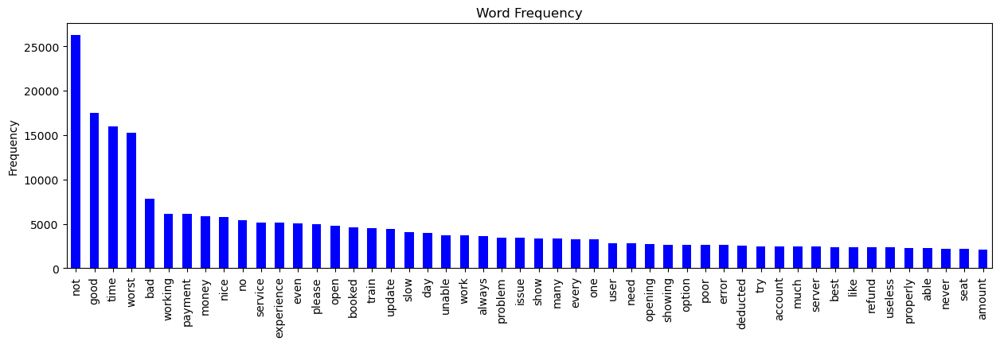

Sparsity:  99.41629375 %


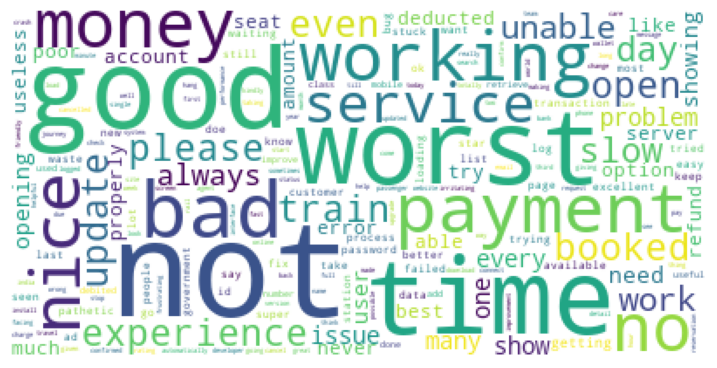

In [8]:

# Trying different vectorization methods ( Count and TFIDF) and frequency plot on entire text review data
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

# will be trying with mutiple n gram combination to arrive at final best params for max_features, ngram_range, min_df

countvect = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1,1 ), min_df=2, encoding='latin-1',max_features=800)
df1_count = countvect.fit_transform(final['translated_content_cleaned'])
dtm_df1=df1_count.toarray()
dtm_df1=pd.DataFrame(dtm_df1, columns=countvect.get_feature_names_out())
word_freq = pd.DataFrame(dtm_df1.apply(sum), columns=['freq'])
word_freq.sort_values('freq', ascending=False, inplace=True)
word_freq.head(50).plot(kind='bar', color='blue', legend=False,figsize=(15,4)).set(title='Word Frequency', ylabel='Frequency')
plt.show()

# should be high, but not too high. 98-99% is good
print("Sparsity: ",(1-(np.count_nonzero(df1_count.toarray())/df1_count.toarray().size))*100,'%')

# plotting wordclouds, to see /analyze it a bit better and something that helps in adding an aesthetic appeal rather than just simple bar plots

wordcloud = WordCloud(background_color='white', stopwords=stop_words)
word_freq = dict(dtm_df1.apply(sum))
wordcloud = wordcloud.generate_from_frequencies(word_freq)   # from word frequency
fig = plt.figure(1, figsize=(9, 6))
plt.axis('off')
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 200
plt.imshow(wordcloud)    # function to display data as image
plt.show() 

# clearly we can see most common words like book, issue, please, good,worst, ticket etc in our data are prevalent

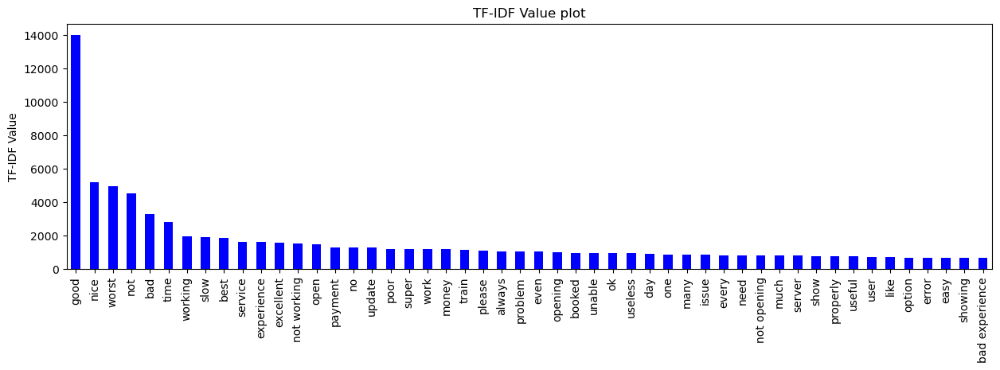

Sparsity:  99.35043875000001 %


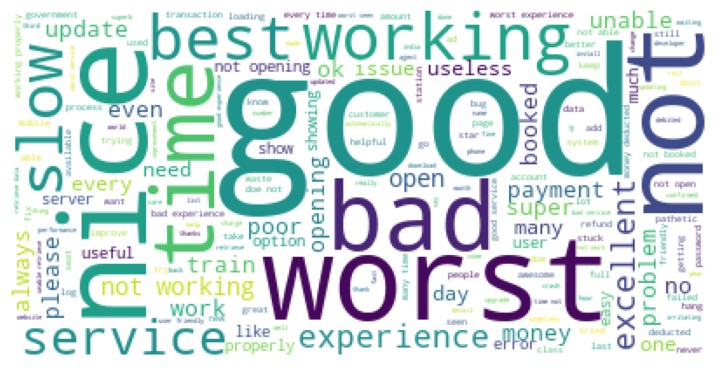

In [10]:
tfidf = TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1,2 ), min_df=4, encoding='latin-1',max_features=800,smooth_idf=True)
df1_tfidf = tfidf.fit_transform(final['translated_content_cleaned'])
dtm_df1_tf=df1_tfidf.toarray()
dtm_df1_tf=pd.DataFrame(dtm_df1_tf, columns=tfidf.get_feature_names_out())
word_freq = pd.DataFrame(dtm_df1_tf.apply(sum), columns=['tf_idf_value'])
word_freq.sort_values('tf_idf_value', ascending=False, inplace=True)
word_freq.head(50).plot(kind='bar', color='blue', legend=False,figsize=(15,4)).set(title='TF-IDF Value plot', ylabel='TF-IDF Value')
plt.show()
# should be high, but not too high. 98-99% is good
print("Sparsity: ",(1-(np.count_nonzero(df1_tfidf.toarray())/df1_tfidf.toarray().size))*100,'%')

wordcloud = WordCloud(background_color='white', stopwords=stop_words)
word_freq = dict(dtm_df1_tf.apply(sum))
wordcloud = wordcloud.generate_from_frequencies(word_freq)   # from word frequency
fig = plt.figure(1, figsize=(9, 6))
plt.axis('off')
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 200
plt.imshow(wordcloud)    # function to display data as image
plt.show() 


In [109]:
%%time
# please do not run this cell, as it will take large amount of time to run. You can evalute its output by scrolling in the output space
# LDA
search_params = {'n_components': [10,20,30,50], 'learning_decay': [ .7, .9],'max_iter':[2,5,7],'learning_offset':[30,50]
                 ,"learning_method":['online']}

# Count
lda = LatentDirichletAllocation()
model_count = GridSearchCV(lda, param_grid=search_params,verbose=10,cv=None)
model_count.fit(df1_count)
print('CountVectorizer')
print('Best params',model_count.best_params_)
print('Best score',model_count.best_score_)
best_model_count=model_count.best_estimator_
print("Log likelihood=", best_model_count.score(df1_count))
print("perplexity=",best_model_count.perplexity(df1_count))

# TFIDF
lda = LatentDirichletAllocation()
model_tfidf = GridSearchCV(lda, param_grid=search_params,verbose=10,cv=None)
model_tfidf.fit(df1_tfidf)
print('TF-IDF Vectorizer')
print('Best params',model_tfidf.best_params_)
print('Best score',model_tfidf.best_score_)
best_model_tfidf=model_tfidf.best_estimator_
print("Log likelihood=", best_model_tfidf.score(df1_tfidf))
print("perplexity=",best_model_tfidf.perplexity(df1_tfidf))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10
[CV 1/5; 1/48] END learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10;, score=-758770.638 total time=   5.7s
[CV 2/5; 1/48] START learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10
[CV 2/5; 1/48] END learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10;, score=-689648.778 total time=   5.8s
[CV 3/5; 1/48] START learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10
[CV 3/5; 1/48] END learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10;, score=-838235.888 total time=   5.7s
[CV 4/5; 1/48] START learning_decay=0.7, learning_method=online, learning_offset=30, max_iter=2, n_components=10
[CV 4/5; 1/48] END learning_decay=0.

In [161]:
tf_cv_results=pd.DataFrame(model_tfidf.cv_results_)
count_cv_results=pd.DataFrame(model_count.cv_results_)

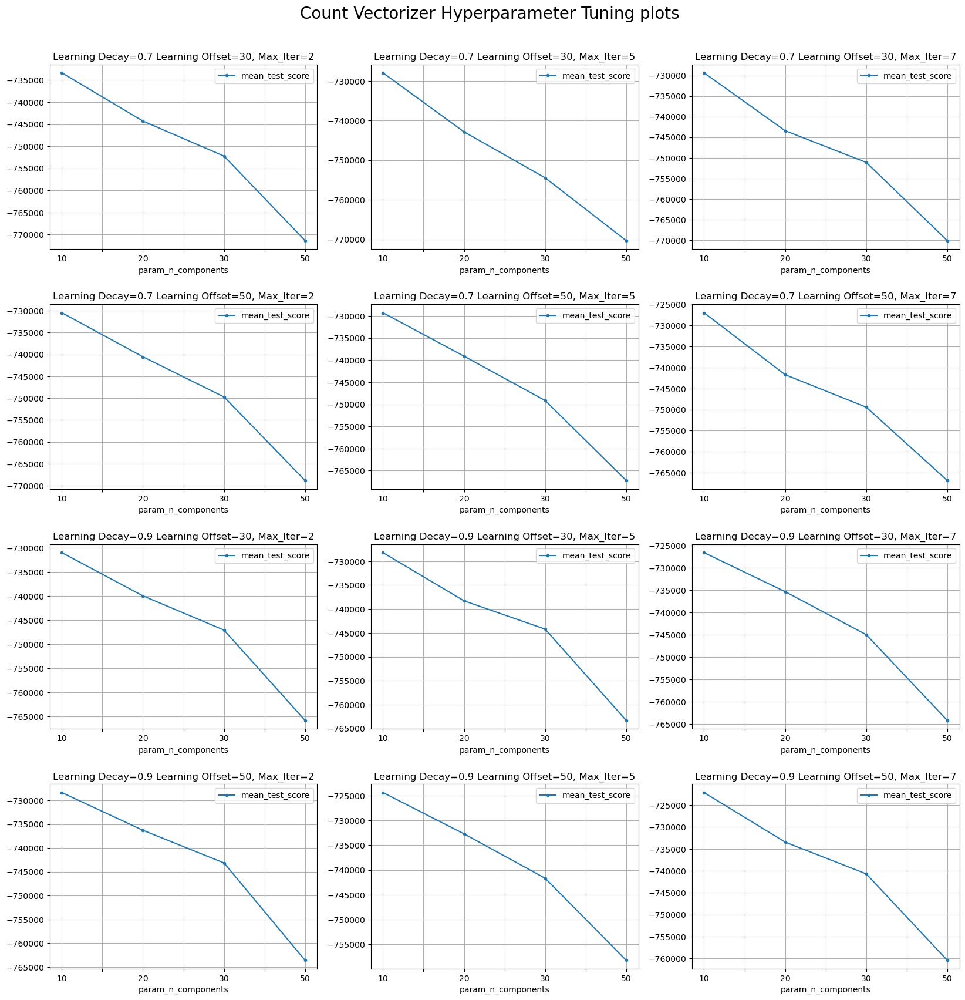

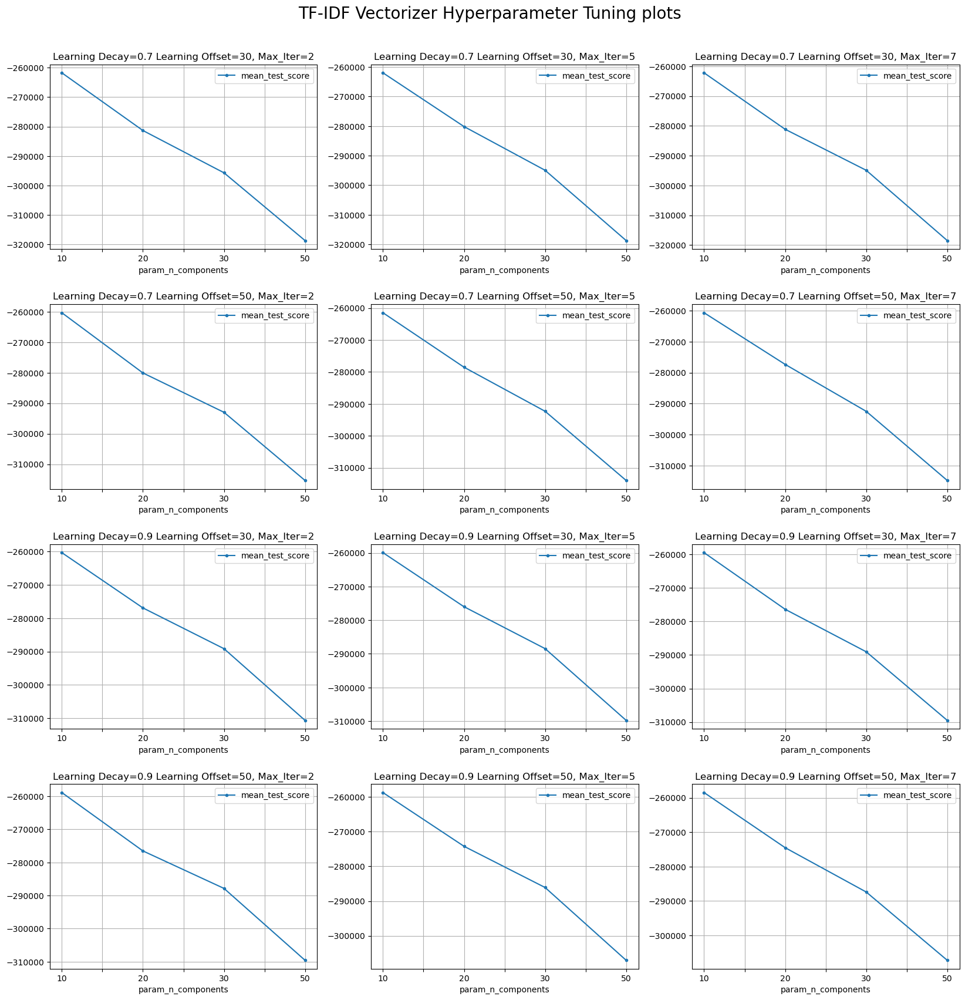

In [206]:
fig,ax=plt.subplots(4,3,figsize=(20,20))
x=0
for ld in [.7, .9]:
    for lo in [30,50]:
        y=-1
        for mi in [2,5,7]:
            y=y+1
            count_cv_results[(count_cv_results.param_learning_decay==ld)&(count_cv_results.param_learning_offset==lo)&(count_cv_results.param_max_iter==mi)][['param_n_components','mean_test_score']].plot(x='param_n_components',marker='.',y='mean_test_score',grid=True,ax=ax[x][y])
            ax[x][y].set_title(f'Learning Decay={ld} Learning Offset={lo}, Max_Iter={mi}')
            ax[x][y].set_title(f'Learning Decay={ld} Learning Offset={lo}, Max_Iter={mi}')
        x=x+1
fig.suptitle('Count Vectorizer Hyperparameter Tuning plots',fontsize=20,y=0.93)
plt.subplots_adjust(hspace=0.3,wspace=0.2)
#plt.tight_layout()
plt.show()

fig,ax=plt.subplots(4,3,figsize=(20,20))
x=0
for ld in [.7, .9]:
    for lo in [30,50]:
        y=-1
        for mi in [2,5,7]:
            y=y+1
            tf_cv_results[(tf_cv_results.param_learning_decay==ld)&(tf_cv_results.param_learning_offset==lo)&(tf_cv_results.param_max_iter==mi)][['param_n_components','mean_test_score']].plot(x='param_n_components',marker='.',y='mean_test_score',grid=True,ax=ax[x][y])
            ax[x][y].set_title(f'Learning Decay={ld} Learning Offset={lo}, Max_Iter={mi}')
            ax[x][y].set_title(f'Learning Decay={ld} Learning Offset={lo}, Max_Iter={mi}')
        x=x+1
fig.suptitle('TF-IDF Vectorizer Hyperparameter Tuning plots',fontsize=20,y=0.93)
plt.subplots_adjust(hspace=0.3,wspace=0.2)
#plt.tight_layout()
plt.show()

In [9]:
%%time # please do not run this cell, as it will take time. 
# making final models
#,max_features=800
countvect = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1,1 ), min_df=4, encoding='latin-1',max_features=800)
df1_count = countvect.fit_transform(final['translated_content_cleaned'])
count_lda=LatentDirichletAllocation(random_state=0,learning_method='online',max_iter=10,learning_offset=20,n_components=10)
data_lda_count=count_lda.fit_transform(df1_count)

# for 20 topics -15k (good) to -40k (bad)
# Log Likelyhood: Higher the better
print("Log Likelihood: (Should be high) ", count_lda.score(df1_count))
# Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
# 50-300 - good
# 300-1000 - medium
# >1000 - poor
print("Perplexity: (Should be low) ", count_lda.perplexity(df1_count))



#,max_features=800
tfidf = TfidfVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1,1 ), min_df=4, encoding='latin-1',smooth_idf=True,max_features=800)
df1_tfidf = tfidf.fit_transform(final['translated_content_cleaned'])

tf_lda=LatentDirichletAllocation(random_state=0,learning_method='online',max_iter=10,learning_offset=20,n_components=10)
data_lda_tf=tf_lda.fit_transform(df1_tfidf)

# for 20 topics -15k (good) to -40k (bad)
# Log Likelyhood: Higher the better
print("Log Likelihood: (Should be high) ", tf_lda.score(df1_tfidf))
# Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
# 50-300 - good
# 300-1000 - medium
# >1000 - poor
print("Perplexity: (Should be low) ", tf_lda.perplexity(df1_tfidf))


Log Likelihood: (Should be high)  -2998005.574002954
Perplexity: (Should be low)  361.9337833598004
Log Likelihood: (Should be high)  -1168575.5252102495
Perplexity: (Should be low)  649.9993224239983
CPU times: user 53.9 s, sys: 293 ms, total: 54.2 s
Wall time: 54.3 s


In [23]:
import pickle
with open('models/count_lda.pkl','rb') as f:
    count_lda=pickle.load(f)
with open('models/countvect.pkl','rb') as f:
    countvect=pickle.load(f)

with open('models/tf_lda.pkl','rb') as f:
    count_lda=pickle.load(f)
with open('models/tfidf_vectorizer.pkl','rb') as f:
    countvect=pickle.load(f)

In [25]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.lda_model.prepare(count_lda, df1_count, countvect, mds='tsne')
pyLDAvis.save_html(panel, 'count_lda_approach_1.html')
panel

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
0     -55.713024   7.358564       1        1  31.460082
7     -51.124077  67.019379       2        1  12.353741
3      27.500385  30.791748       3        1  12.061895
6      -0.071454  -4.653256       4        1   9.875182
2      31.709402 -38.908134       5        1   8.210304
8     -16.935112  37.068726       6        1   7.227106
9      64.980621   2.386728       7        1   7.122966
1     -29.431107 -40.346958       8        1   5.559626
4       6.399876  81.320702       9        1   3.466964
5      59.496670  63.654522      10        1   2.662134, topic_info=          Term          Freq         Total Category  logprob  loglift
298       good  17118.000000  17118.000000  Default  30.0000  30.0000
790      worst  14375.000000  14375.000000  Default  29.0000  29.0000
451       nice   8255.000000   8255.000000  Default  28.0000  28.0000
46         bad   9632.000000   9632.000000  Default  27.0000  27.0000
787    working   6147.000000   6147.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
637     simple      0.144637    446.607825  Topic10 -11.4474  -4.4092
335  important      0.144637    345.311422  Topic10 -11.4474  -4.1519
544     really      0.144637    940.523350  Topic10 -11.4474  -5.1539
795       year      0.144637    914.076610  Topic10 -11.4474  -5.1254
608   security      0.144636    186.664517  Topic10 -11.4474  -3.5368

[500 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
0         1  0.434101        able
0         2  0.024272        able
0         4  0.540993        able
1         6  0.987756  absolutely
2         5  0.993764          ac
...     ...       ...         ...
790       8  0.687618       worst
791       8  0.981524       worth
793       5  0.992164         wow
795       1  0.997728        year
798       8  0.993646         yet

[571 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 8, 4, 7, 3, 9, 10, 2, 5, 6])

In [26]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.lda_model.prepare(tf_lda, df1_tfidf, tfidf, mds='tsne')
pyLDAvis.save_html(panel, 'tf_lda_approach_1.html')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0     -107.322014   70.512802       1        1  23.837394
7      121.499161   36.292297       2        1  12.018001
3      -41.870869  -54.844654       3        1  10.191233
6       54.911823   98.245094       4        1   9.492902
2     -121.857552  -24.024206       5        1   8.295385
8       22.954163 -113.934647       6        1   8.212973
9      -23.704573   38.135292       7        1   7.849536
4      -30.806528  133.384338       8        1   7.434002
1       40.556408  -11.182888       9        1   6.867670
5      112.826942  -64.961578      10        1   5.800903, topic_info=          Term          Freq         Total Category  logprob  loglift
298       good  13012.000000  13012.000000  Default  30.0000  30.0000
451       nice   6376.000000   6376.000000  Default  29.0000  29.0000
790      worst   5674.000000   5674.000000  Default  28.0000  28.0000
46         bad   3766.000000   3766.000000  Default  27.0000  27.0000
57        best   2217.000000   2217.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
637     simple      0.111743    160.073549  Topic10 -11.4474  -4.4200
335  important      0.111743     93.096626  Topic10 -11.4474  -3.8780
544     really      0.111743    315.930784  Topic10 -11.4474  -5.0999
795       year      0.111743    245.890982  Topic10 -11.4474  -4.8493
608   security      0.111743     67.173018  Topic10 -11.4474  -3.5517

[500 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
0         1  0.376834        able
0         2  0.027132        able
0         4  0.595398        able
1         6  0.985563  absolutely
2         5  0.990620          ac
...     ...       ...         ...
790       9  0.762919       worst
791       9  0.991416       worth
793       5  0.995156         wow
795       1  0.996377        year
798       9  0.996415         yet

[572 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 8, 4, 7, 3, 9, 10, 5, 2, 6])

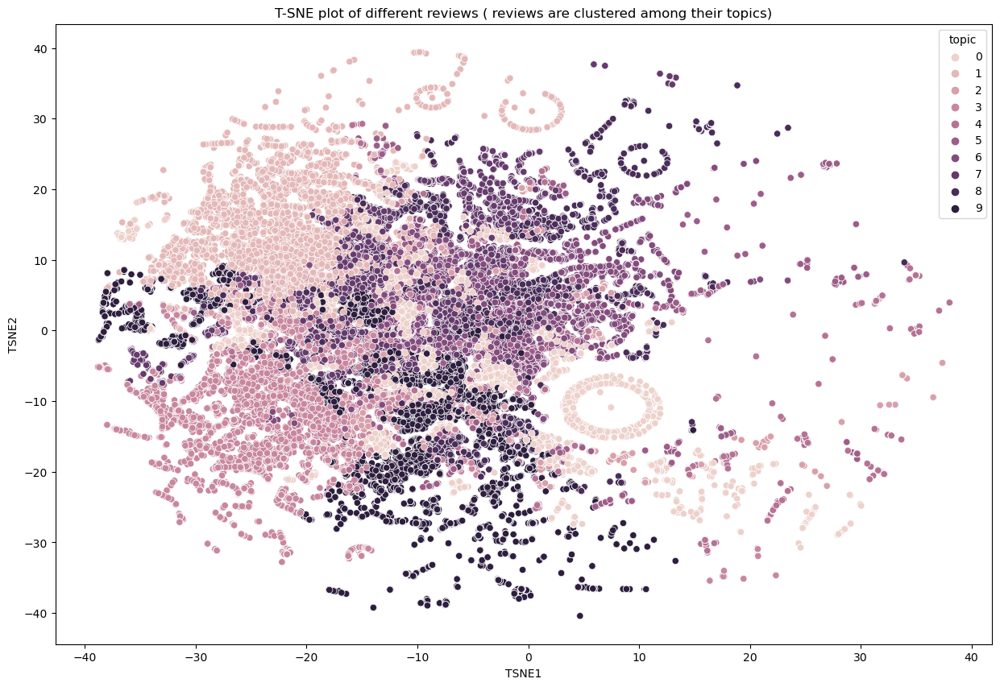

In [16]:
# TSNE plots of documents
# Will take long time to run, so please do not run. 
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=1000, random_state=0, angle=0.75)
tsne_features = tsne_model.fit_transform(data_lda_count)
df_tsne = pd.DataFrame(tsne_features)
df_tsne['topic'] = data_lda_count.argmax(axis=1)
df_tsne.columns = ['TSNE1', 'TSNE2', 'topic']
import seaborn as sns


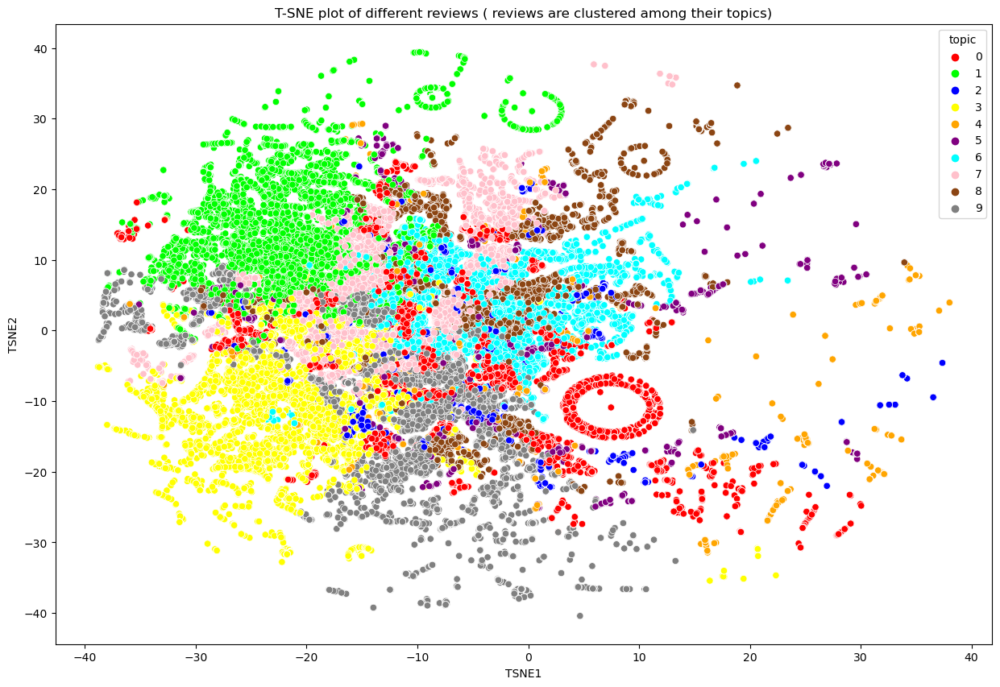

In [17]:
plt.figure(figsize=(15, 10))
plt.title('T-SNE plot of different reviews ( reviews are clustered among their topics)')
ax = sns.scatterplot(x = 'TSNE1', y = 'TSNE2', hue = 'topic', data = df_tsne, legend = 'full'
 ,palette = [
  "#FF0000",  # Red
    "#00FF00",  # Green
    "#0000FF",  # Blue
    "#FFFF00",  # Yellow
    "#FFA500",  # Orange
    "#800080",  # Purple
    "#00FFFF",  # Cyan
    "#FFC0CB",  # Pink
    "#8B4513",  # Brown
    "#808080",  # Gray
    "#008000",  # Dark Green
    "#4B0082",  # Indigo
    "#FF1493",  # Deep Pink
    "#008080",  # Teal
    "#FF4500",  # Orange Red
    "#DA70D6",  # Orchid
    "#7FFF00",  # Chartreuse
    "#DC143C",  # Crimson
    "#B8860B",  # Dark Goldenrod
    "#4682B4"   # Steel Blue
 ]
)

In [24]:
# manual human checking of words in each topic
terms=countvect.get_feature_names_out()

def selected_topics(model, vectorizer, top_n=10):
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(terms[i], str(round(topic[i],2))+"%") for i in topic.argsort()[:-top_n - 1:-1]]) 
selected_topics(count_lda, df1_count)

Topic 0:
[('time', '1758.65%'), ('not', '1519.58%'), ('update', '1011.06%'), ('problem', '994.33%'), ('opening', '908.5%'), ('unable', '865.45%'), ('always', '802.77%'), ('worst', '795.64%'), ('please', '786.41%'), ('every', '777.01%')]
Topic 1:
[('worst', '3735.26%'), ('service', '1557.43%'), ('super', '1260.29%'), ('seen', '424.48%'), ('one', '350.39%'), ('india', '281.08%'), ('used', '266.83%'), ('difficult', '226.2%'), ('happy', '211.49%'), ('life', '151.82%')]
Topic 2:
[('no', '542.47%'), ('train', '465.38%'), ('class', '427.51%'), ('option', '425.29%'), ('like', '378.73%'), ('add', '352.01%'), ('third', '296.04%'), ('superb', '291.45%'), ('reservation', '218.4%'), ('change', '208.68%')]
Topic 3:
[('slow', '1650.57%'), ('money', '1035.73%'), ('booked', '782.82%'), ('deducted', '722.96%'), ('not', '696.69%'), ('refund', '634.92%'), ('payment', '551.37%'), ('amount', '538.67%'), ('better', '461.29%'), ('account', '444.11%')]
Topic 4:
[('good', '15173.43%'), ('fast', '284.49%'), ('op

In [29]:
# manual human checking of documents
doc_topics1 = pd.DataFrame(data_lda_count)
topics = 'TOPIC_' + pd.Series(list(range(0,10))).astype(str)
doc_topics1.columns = topics.tolist()
dominating_topic = []
sub_topic = []
for i in range(0,len(doc_topics1)):
    r = doc_topics1.loc[i,]
    dom_topic = r.sort_values(ascending=False).head(1).index[0] if r.sort_values(ascending=False).head(1)[0]>=0.5 else 'Not able as below 0.5, else it will be '+r.sort_values(ascending=False).head(1).index[0]
    sub_tp = " + ".join(list(r.sort_values(ascending=False)[1:20].index))
    dominating_topic.append(dom_topic)
    sub_topic.append(sub_tp)

dominating_topic = pd.Series(dominating_topic)
dominating_topic.name = "MAIN_TOPIC"
sub_topic = pd.Series(sub_topic)
sub_topic.name = "SUB_TOPICS"
doc_topics = pd.concat([final,doc_topics1,dominating_topic,sub_topic],axis=1)

# placing topic against the documents

top_n=10
b=[]
b2=[]
for idx, topic in enumerate(count_lda.components_):
    tt=[]
    tt2=[]
    tt.append([str(countvect.get_feature_names_out()[i])+" "+str(round(topic[i],2))+"%"
                        for i in topic.argsort()[:-top_n - 1:-1]])
    tt2.append([str(countvect.get_feature_names_out()[i]) for i in topic.argsort()[:-top_n - 1:-1]])
    b.append(', '.join(tt[0]))
    b2.append(', '.join(tt2[0]))


bb=pd.Series(b,index=topics).to_dict()
review_category = doc_topics.MAIN_TOPIC.replace(bb)
review_category.name = 'review_category'

bb2=pd.Series(b2,index=topics).to_dict()
review_category2 = doc_topics.MAIN_TOPIC.replace(bb2)
review_category2.name = 'review_category2'

doc_topics['review_category'] = review_category
doc_topics['review_category2'] = review_category2
# doc_topics_tf[doc_topics_tf.columns.difference(['content', 'reviewId', 'userName', 'userImage', 'score', 'thumbsUpCount', 'reviewCreatedVersion',
#  'at', 'replyContent', 'repliedAt', 'appVersion', 'sentiment_TextBlob', 'sentiment_TextBlob_outcome','SUB_TOPICS'])]
topics = 'TOPIC_' + pd.Series(list(range(0,10))).astype(str)
for x in topics:
    display(doc_topics[doc_topics.MAIN_TOPIC==x][['MAIN_TOPIC','translated_content','translated_content_cleaned','review_category2']].head(5))

,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
21,TOPIC_0,Always hangs and lags often never work smoothly,always hang lag often never work smoothly,"time, not, update, problem, opening, unable, always, worst, please, every"
71,TOPIC_0,App crash too much Sometimes when I book tickets then app doesn't work it's need improvement,crash much sometimes work need improvement,"time, not, update, problem, opening, unable, always, worst, please, every"
110,TOPIC_0,Useless,useless,"time, not, update, problem, opening, unable, always, worst, please, every"
111,TOPIC_0,Indian government 🤡,government,"time, not, update, problem, opening, unable, always, worst, please, every"
134,TOPIC_0,Love it,love,"time, not, update, problem, opening, unable, always, worst, please, every"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
11,TOPIC_1,Pls book to IRCTC app no extra charges ❤️🙏🚂🚃,no extra charge,"worst, service, super, seen, one, india, used, difficult, happy, life"
15,TOPIC_1,ALWAYS AMOUNT DEDUCTED FROM MY ACCOUNT BUT TICKETS NOT ISSUED....! MANY TIMES THIS HAPPENING..... CORRECT THIS PROBLEM....!,always amount deducted account not issued many time happening correct problem,"worst, service, super, seen, one, india, used, difficult, happy, life"
31,TOPIC_1,Failed no ticket booking.Also refund not received,failed no refund not received,"worst, service, super, seen, one, india, used, difficult, happy, life"
46,TOPIC_1,Super,super,"worst, service, super, seen, one, india, used, difficult, happy, life"
50,TOPIC_1,refund amount very low,refund amount low,"worst, service, super, seen, one, india, used, difficult, happy, life"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
3,TOPIC_2,There are good apps for booking tickets but a good internet is required to book instant tickets,good good internet required instant,"no, train, class, option, like, add, third, superb, reservation, change"
6,TOPIC_2,Very comfortable,comfortable,"no, train, class, option, like, add, third, superb, reservation, change"
12,TOPIC_2,Single,single,"no, train, class, option, like, add, third, superb, reservation, change"
16,TOPIC_2,Unable to enter source & destination stations! redirected to home page while giving source and destination!,unable enter source destination station redirected home page giving source destination,"no, train, class, option, like, add, third, superb, reservation, change"
220,TOPIC_2,Definitely not a good App it is .... can't able to use it at all .... Advertisements are covered up that the main page is not visible and cannot move further.,definitely bad able advertisement covered main page not visible move,"no, train, class, option, like, add, third, superb, reservation, change"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
23,TOPIC_3,We ate happy to connect with you,ate happy connect,"slow, money, booked, deducted, not, refund, payment, amount, better, account"
49,TOPIC_3,Mast,mast,"slow, money, booked, deducted, not, refund, payment, amount, better, account"
101,TOPIC_3,Very slow app,slow,"slow, money, booked, deducted, not, refund, payment, amount, better, account"
104,TOPIC_3,"Getting an error ""Unable to retrieve data, please try again""",getting error unable retrieve data please try,"slow, money, booked, deducted, not, refund, payment, amount, better, account"
118,TOPIC_3,"The app is very slow, it is running with error only",slow running error,"slow, money, booked, deducted, not, refund, payment, amount, better, account"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
1,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall"
2,TOPIC_4,Good 👍,good,"good, fast, operate, issued, service, job, easy, experience, free, overall"
7,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall"
8,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall"
9,TOPIC_4,I couldn't change my phone number... Please change it now,change phone number please change,"good, fast, operate, issued, service, job, easy, experience, free, overall"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
0,TOPIC_5,Best,best,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid"
10,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid"
24,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid"
33,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid"
38,TOPIC_5,Very nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
53,TOPIC_6,New registration is stoped,new registration stoped,"user, not, password, friendly, able, id, new, never, download, updated"
55,TOPIC_6,"Very very unsatisfactory From the past, one weak I tried to book railway ticket. But in spite of my best efforts i couldn't book under the reason ' your USERS NAME AND PASS WORD NOT CORRECT.Kindly guide properly.",unsatisfactory past one weak tried spite best effort reason user name pas word not correct kindly guide properly,"user, not, password, friendly, able, id, new, never, download, updated"
66,TOPIC_6,One of the ghatia aap,one,"user, not, password, friendly, able, id, new, never, download, updated"
92,TOPIC_6,"Worst app. While Registering user, user name not taken even our name has applicable in the terms and conditions. Worst app. Waste of time....",worst registering user user name not taken even name applicable term condition worst waste time,"user, not, password, friendly, able, id, new, never, download, updated"
95,TOPIC_6,Third class app. I tried 50 times to login but showing error and no any other option to login. This app is like too old. Behaving like nokia phone.,third class tried time showing error no option like old behaving like phone,"user, not, password, friendly, able, id, new, never, download, updated"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
14,TOPIC_7,Helpful,helpful,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people"
18,TOPIC_7,"You people are just fooling us by charging the service charge why you are not able to maintain the speed of servers, we are facing lot of service issue of speed while booking ticket in tatkal it just buffering and you people are just deducting amount for tatkal waiting list ticket also",people fooling charging service charge not able maintain speed server facing lot service issue speed buffering people deducting amount waiting list,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people"
85,TOPIC_7,Very very worst & irritated app. Emergency time la takal la booking akaathu. Payment poittu error varum. Waiting list la ticket cancel aana kooda 120+ thandam kettanum. Fraud railway.,worst irritated emergency time la la payment error waiting list la cancel fraud,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people"
98,TOPIC_7,Please develop the aap ai,please develop ai,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people"
109,TOPIC_7,Irritating app,irritating,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
28,TOPIC_8,User interface is not good,user interface bad,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system"
37,TOPIC_8,"I always opt for window seat and I get asile seat and it's so irritating that I don't get seat of my choice when I get option to select my seat. It's absolutely ridiculous system, please correct your nonsense application.",always opt window seat seat irritating seat choice option select seat absolutely ridiculous system please correct nonsense,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system"
69,TOPIC_8,If go to the station code it comes back again to the home page.,go station code come back home page,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system"
70,TOPIC_8,very bad experience with this app,bad experience,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system"
73,TOPIC_8,go good travel booking,go good travel,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
17,TOPIC_9,Very useful app,useful,"excellent, not, working, work, properly, useful, open, most, time, thank"
27,TOPIC_9,Excellent,excellent,"excellent, not, working, work, properly, useful, open, most, time, thank"
35,TOPIC_9,Excellent,excellent,"excellent, not, working, work, properly, useful, open, most, time, thank"
54,TOPIC_9,It not good at least it is not take registration also,bad least not take registration,"excellent, not, working, work, properly, useful, open, most, time, thank"
57,TOPIC_9,Thank you,thank,"excellent, not, working, work, properly, useful, open, most, time, thank"


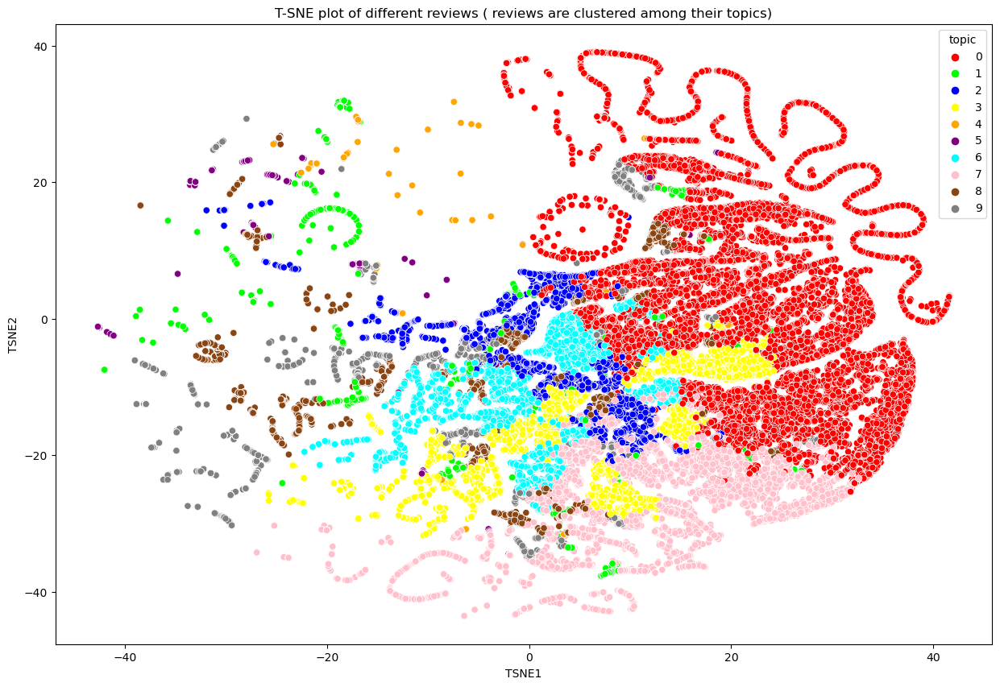

In [30]:
tsne_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=1000, random_state=0, angle=0.75)
tsne_features = tsne_model.fit_transform(data_lda_tf)
df_tsne = pd.DataFrame(tsne_features)
df_tsne['topic'] = data_lda_tf.argmax(axis=1)
df_tsne.columns = ['TSNE1', 'TSNE2', 'topic']
import seaborn as sns
plt.figure(figsize=(15, 10))
plt.title('T-SNE plot of different reviews ( reviews are clustered among their topics)')
ax = sns.scatterplot(x = 'TSNE1', y = 'TSNE2', hue = 'topic', data = df_tsne, legend = 'full'
,palette = [
  "#FF0000",  # Red
    "#00FF00",  # Green
    "#0000FF",  # Blue
    "#FFFF00",  # Yellow
    "#FFA500",  # Orange
    "#800080",  # Purple
    "#00FFFF",  # Cyan
    "#FFC0CB",  # Pink
    "#8B4513",  # Brown
    "#808080",  # Gray
    "#008000",  # Dark Green
    "#4B0082",  # Indigo
    "#FF1493",  # Deep Pink
    "#008080",  # Teal
    "#FF4500",  # Orange Red
    "#DA70D6",  # Orchid
    "#7FFF00",  # Chartreuse
    "#DC143C",  # Crimson
    "#B8860B",  # Dark Goldenrod
    "#4682B4"   # Steel Blue
]
)
plt.show()

In [31]:
terms=tfidf.get_feature_names_out()

def selected_topics(model, vectorizer, top_n=10):
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(terms[i], str(round(topic[i],2))+"%") for i in topic.argsort()[:-top_n - 1:-1]]) 
selected_topics(tf_lda, df1_tfidf)

Topic 0:
[('time', '1758.65%'), ('not', '1519.58%'), ('update', '1011.06%'), ('problem', '994.33%'), ('opening', '908.5%'), ('unable', '865.45%'), ('always', '802.77%'), ('worst', '795.64%'), ('please', '786.41%'), ('every', '777.01%')]
Topic 1:
[('worst', '3735.26%'), ('service', '1557.43%'), ('super', '1260.29%'), ('seen', '424.48%'), ('one', '350.39%'), ('india', '281.08%'), ('used', '266.83%'), ('difficult', '226.2%'), ('happy', '211.49%'), ('life', '151.82%')]
Topic 2:
[('no', '542.47%'), ('train', '465.38%'), ('class', '427.51%'), ('option', '425.29%'), ('like', '378.73%'), ('add', '352.01%'), ('third', '296.04%'), ('superb', '291.45%'), ('reservation', '218.4%'), ('change', '208.68%')]
Topic 3:
[('slow', '1650.57%'), ('money', '1035.73%'), ('booked', '782.82%'), ('deducted', '722.96%'), ('not', '696.69%'), ('refund', '634.92%'), ('payment', '551.37%'), ('amount', '538.67%'), ('better', '461.29%'), ('account', '444.11%')]
Topic 4:
[('good', '15173.43%'), ('fast', '284.49%'), ('op

In [32]:
doc_topics1 = pd.DataFrame(data_lda_tf)
topics = 'TOPIC_' + pd.Series(list(range(0,10))).astype(str)
doc_topics1.columns = topics.tolist()
dominating_topic = []
sub_topic = []
for i in range(0,len(doc_topics1)):
    r = doc_topics1.loc[i,]
    dom_topic = r.sort_values(ascending=False).head(1).index[0] if r.sort_values(ascending=False).head(1)[0]>=0.5 else 'Not able as below 0.5, else it will be '+r.sort_values(ascending=False).head(1).index[0]
    sub_tp = " + ".join(list(r.sort_values(ascending=False)[1:20].index))
    dominating_topic.append(dom_topic)
    sub_topic.append(sub_tp)

dominating_topic = pd.Series(dominating_topic)
dominating_topic.name = "MAIN_TOPIC"
sub_topic = pd.Series(sub_topic)
sub_topic.name = "SUB_TOPICS"
doc_topics_tf = pd.concat([final,doc_topics1,dominating_topic,sub_topic],axis=1)

# placing topic against the documents

top_n=20
b=[]
b2=[]
for idx, topic in enumerate(tf_lda.components_):
    tt=[]
    tt2=[]
    tt.append([str(tfidf.get_feature_names_out()[i])+" "+str(round(topic[i],2))+"%"
                        for i in topic.argsort()[:-top_n - 1:-1]])
    tt2.append([str(tfidf.get_feature_names_out()[i]) for i in topic.argsort()[:-top_n - 1:-1]])
    b.append(', '.join(tt[0]))
    b2.append(', '.join(tt2[0]))


bb=pd.Series(b,index=topics).to_dict()
review_category = doc_topics_tf.MAIN_TOPIC.replace(bb)
review_category.name = 'review_category'

bb2=pd.Series(b2,index=topics).to_dict()
review_category2 = doc_topics_tf.MAIN_TOPIC.replace(bb2)
review_category2.name = 'review_category2'

doc_topics_tf['review_category'] = review_category
doc_topics_tf['review_category2'] = review_category2
# doc_topics_tf[doc_topics_tf.columns.difference(['content', 'reviewId', 'userName', 'userImage', 'score', 'thumbsUpCount', 'reviewCreatedVersion',
#  'at', 'replyContent', 'repliedAt', 'appVersion', 'sentiment_TextBlob', 'sentiment_TextBlob_outcome','SUB_TOPICS'])]
topics = 'TOPIC_' + pd.Series(list(range(0,20))).astype(str)
for x in topics:
    display(doc_topics_tf[doc_topics_tf.MAIN_TOPIC==x][['MAIN_TOPIC','translated_content','translated_content_cleaned','review_category2']].head(5))

,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
4,TOPIC_0,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,one pathetic trying download every time error,"time, not, update, problem, opening, unable, always, worst, please, every, issue, day, open, payment, error, showing, many, transaction, show, even"
21,TOPIC_0,Always hangs and lags often never work smoothly,always hang lag often never work smoothly,"time, not, update, problem, opening, unable, always, worst, please, every, issue, day, open, payment, error, showing, many, transaction, show, even"
32,TOPIC_0,it is my MAJBOORI to ise this app otherwise i would have never installed it. It is torture to use this app.,never installed torture,"time, not, update, problem, opening, unable, always, worst, please, every, issue, day, open, payment, error, showing, many, transaction, show, even"
71,TOPIC_0,App crash too much Sometimes when I book tickets then app doesn't work it's need improvement,crash much sometimes work need improvement,"time, not, update, problem, opening, unable, always, worst, please, every, issue, day, open, payment, error, showing, many, transaction, show, even"
104,TOPIC_0,"Getting an error ""Unable to retrieve data, please try again""",getting error unable retrieve data please try,"time, not, update, problem, opening, unable, always, worst, please, every, issue, day, open, payment, error, showing, many, transaction, show, even"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
46,TOPIC_1,Super,super,"worst, service, super, seen, one, india, used, difficult, happy, life, bed, running, fantastic, shame, yet, platform, slowly, history, low, respond"
66,TOPIC_1,One of the ghatia aap,one,"worst, service, super, seen, one, india, used, difficult, happy, life, bed, running, fantastic, shame, yet, platform, slowly, history, low, respond"
72,TOPIC_1,Worst app,worst,"worst, service, super, seen, one, india, used, difficult, happy, life, bed, running, fantastic, shame, yet, platform, slowly, history, low, respond"
148,TOPIC_1,Worst 👎services... Now,worst service,"worst, service, super, seen, one, india, used, difficult, happy, life, bed, running, fantastic, shame, yet, platform, slowly, history, low, respond"
152,TOPIC_1,Worst,worst,"worst, service, super, seen, one, india, used, difficult, happy, life, bed, running, fantastic, shame, yet, platform, slowly, history, low, respond"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
6,TOPIC_2,Very comfortable,comfortable,"no, train, class, option, like, add, third, superb, reservation, change, status, passenger, not, wallet, list, station, required, food, simple, provide"
12,TOPIC_2,Single,single,"no, train, class, option, like, add, third, superb, reservation, change, status, passenger, not, wallet, list, station, required, food, simple, provide"
16,TOPIC_2,Unable to enter source & destination stations! redirected to home page while giving source and destination!,unable enter source destination station redirected home page giving source destination,"no, train, class, option, like, add, third, superb, reservation, change, status, passenger, not, wallet, list, station, required, food, simple, provide"
95,TOPIC_2,Third class app. I tried 50 times to login but showing error and no any other option to login. This app is like too old. Behaving like nokia phone.,third class tried time showing error no option like old behaving like phone,"no, train, class, option, like, add, third, superb, reservation, change, status, passenger, not, wallet, list, station, required, food, simple, provide"
167,TOPIC_2,No option of showing running status !!,no option showing running status,"no, train, class, option, like, add, third, superb, reservation, change, status, passenger, not, wallet, list, station, required, food, simple, provide"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
11,TOPIC_3,Pls book to IRCTC app no extra charges ❤️🙏🚂🚃,no extra charge,"slow, money, booked, deducted, not, refund, payment, amount, better, account, customer, time, debited, automatically, failed, no, rail, care, confirmed, response"
31,TOPIC_3,Failed no ticket booking.Also refund not received,failed no refund not received,"slow, money, booked, deducted, not, refund, payment, amount, better, account, customer, time, debited, automatically, failed, no, rail, care, confirmed, response"
34,TOPIC_3,It is a good app but sometimes there is some technical problems,good sometimes technical problem,"slow, money, booked, deducted, not, refund, payment, amount, better, account, customer, time, debited, automatically, failed, no, rail, care, confirmed, response"
49,TOPIC_3,Mast,mast,"slow, money, booked, deducted, not, refund, payment, amount, better, account, customer, time, debited, automatically, failed, no, rail, care, confirmed, response"
59,TOPIC_3,This is better apps,better,"slow, money, booked, deducted, not, refund, payment, amount, better, account, customer, time, debited, automatically, failed, no, rail, care, confirmed, response"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
1,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall, secure, work, train, need, enough, understand, please, faster, one, important"
2,TOPIC_4,Good 👍,good,"good, fast, operate, issued, service, job, easy, experience, free, overall, secure, work, train, need, enough, understand, please, faster, one, important"
7,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall, secure, work, train, need, enough, understand, please, faster, one, important"
8,TOPIC_4,Good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall, secure, work, train, need, enough, understand, please, faster, one, important"
13,TOPIC_4,Very good,good,"good, fast, operate, issued, service, job, easy, experience, free, overall, secure, work, train, need, enough, understand, please, faster, one, important"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
0,TOPIC_5,Best,best,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid, operate, way, handle, secure, one, internet, love, online, fast, wish"
10,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid, operate, way, handle, secure, one, internet, love, online, fast, wish"
24,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid, operate, way, handle, secure, one, internet, love, online, fast, wish"
33,TOPIC_5,Nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid, operate, way, handle, secure, one, internet, love, online, fast, wish"
38,TOPIC_5,Very nice,nice,"nice, best, easy, great, connection, train, trash, hopeless, forever, avoid, operate, way, handle, secure, one, internet, love, online, fast, wish"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
53,TOPIC_6,New registration is stoped,new registration stoped,"user, not, password, friendly, able, id, new, never, download, updated, number, fine, thanks, worst, version, well, email, help, account, worse"
55,TOPIC_6,"Very very unsatisfactory From the past, one weak I tried to book railway ticket. But in spite of my best efforts i couldn't book under the reason ' your USERS NAME AND PASS WORD NOT CORRECT.Kindly guide properly.",unsatisfactory past one weak tried spite best effort reason user name pas word not correct kindly guide properly,"user, not, password, friendly, able, id, new, never, download, updated, number, fine, thanks, worst, version, well, email, help, account, worse"
85,TOPIC_6,Very very worst & irritated app. Emergency time la takal la booking akaathu. Payment poittu error varum. Waiting list la ticket cancel aana kooda 120+ thandam kettanum. Fraud railway.,worst irritated emergency time la la payment error waiting list la cancel fraud,"user, not, password, friendly, able, id, new, never, download, updated, number, fine, thanks, worst, version, well, email, help, account, worse"
89,TOPIC_6,"I forgot my login id and password I tried many times to login but the login details show wrong, and if I try to create a new id again it doesn't work so this app is very bad for users. So I would just say avoid this app and use another good app.",forgot id password tried many time detail show wrong try create new id work bad user say avoid another good,"user, not, password, friendly, able, id, new, never, download, updated, number, fine, thanks, worst, version, well, email, help, account, worse"
133,TOPIC_6,Iss a emergency 🦺 tool for me 💕,emergency tool,"user, not, password, friendly, able, id, new, never, download, updated, number, fine, thanks, worst, version, well, email, help, account, worse"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
14,TOPIC_7,Helpful,helpful,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people, service, government, irritating, full, need, improve, website, most, waiting, updating"
18,TOPIC_7,"You people are just fooling us by charging the service charge why you are not able to maintain the speed of servers, we are facing lot of service issue of speed while booking ticket in tatkal it just buffering and you people are just deducting amount for tatkal waiting list ticket also",people fooling charging service charge not able maintain speed server facing lot service issue speed buffering people deducting amount waiting list,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people, service, government, irritating, full, need, improve, website, most, waiting, updating"
61,TOPIC_7,Advanced features,advanced feature,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people, service, government, irritating, full, need, improve, website, most, waiting, updating"
87,TOPIC_7,Very poor service. Confirm tickets are not booked,poor service confirm not booked,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people, service, government, irritating, full, need, improve, website, most, waiting, updating"
98,TOPIC_7,Please develop the aap ai,please develop ai,"poor, useless, waste, helpful, ad, server, awesome, worst, time, people, service, government, irritating, full, need, improve, website, most, waiting, updating"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
37,TOPIC_8,"I always opt for window seat and I get asile seat and it's so irritating that I don't get seat of my choice when I get option to select my seat. It's absolutely ridiculous system, please correct your nonsense application.",always opt window seat seat irritating seat choice option select seat absolutely ridiculous system please correct nonsense,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system, interface, go, station, world, journey, travel, really, slow, availability, train"
43,TOPIC_8,it is very slow in loading page and automaticall shutdown app ......,slow loading page shutdown,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system, interface, go, station, world, journey, travel, really, slow, availability, train"
69,TOPIC_8,If go to the station code it comes back again to the home page.,go station code come back home page,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system, interface, go, station, world, journey, travel, really, slow, availability, train"
70,TOPIC_8,very bad experience with this app,bad experience,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system, interface, go, station, world, journey, travel, really, slow, availability, train"
73,TOPIC_8,go good travel booking,go good travel,"bad, experience, ok, seat, loading, pathetic, available, site, performance, system, interface, go, station, world, journey, travel, really, slow, availability, train"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
17,TOPIC_9,Very useful app,useful,"excellent, not, working, work, properly, useful, open, most, time, thank, doe, information, phone, timing, right, update, verification, public, confirmation, today"
27,TOPIC_9,Excellent,excellent,"excellent, not, working, work, properly, useful, open, most, time, thank, doe, information, phone, timing, right, update, verification, public, confirmation, today"
35,TOPIC_9,Excellent,excellent,"excellent, not, working, work, properly, useful, open, most, time, thank, doe, information, phone, timing, right, update, verification, public, confirmation, today"
57,TOPIC_9,Thank you,thank,"excellent, not, working, work, properly, useful, open, most, time, thank, doe, information, phone, timing, right, update, verification, public, confirmation, today"
63,TOPIC_9,Mobile App is not working since today morning.,mobile not working today morning,"excellent, not, working, work, properly, useful, open, most, time, thank, doe, information, phone, timing, right, update, verification, public, confirmation, today"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


# making Word2Vec Model

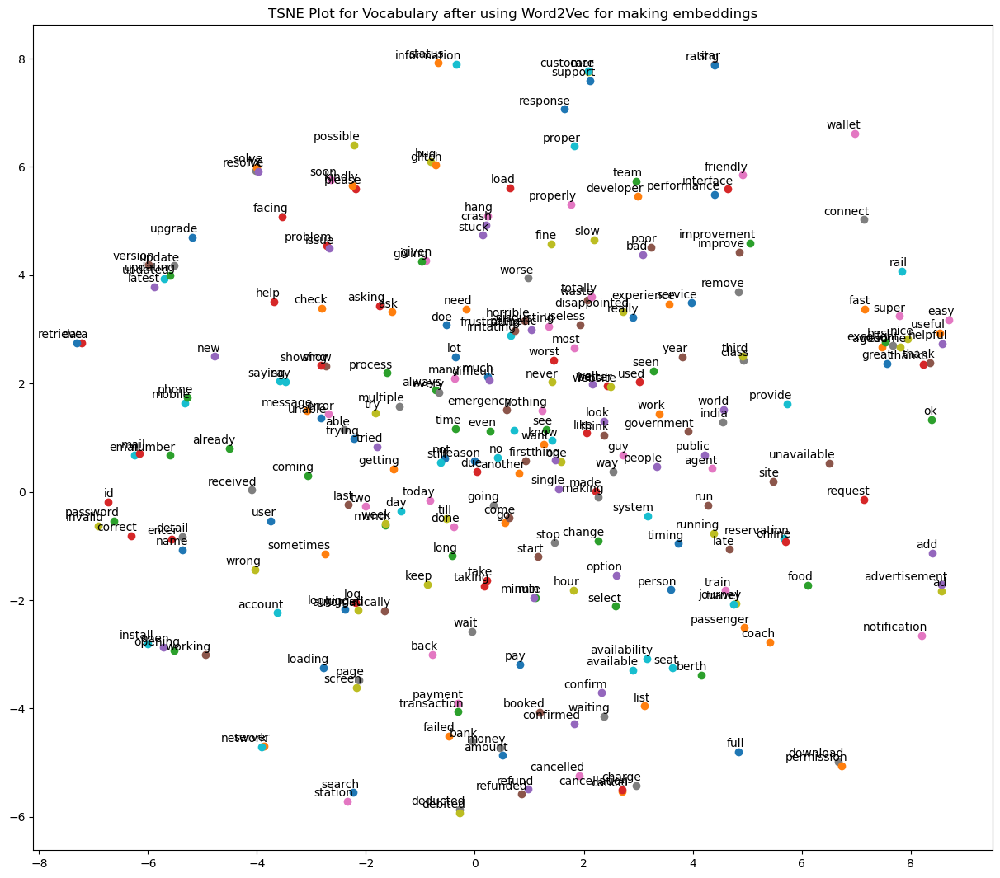

In [33]:
# trying word embeddings # using skip gram finally as per iterative checking
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
tokens = final["translated_content_cleaned"].apply(lambda x: x.split(' '))
w2v_model = Word2Vec(tokens,
                     min_count=400,
                     window=10,
                     alpha=0.03, 
                     min_alpha=0.0007,
                     workers = 4,
                     sg=1,
                     seed = 42)

labels = []
tokens = []

for word in list(w2v_model.wv.index_to_key):
    tokens.append(w2v_model.wv[word])
    labels.append(word)

tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=2000, random_state=23)
new_values = tsne_model.fit_transform(pd.DataFrame(tokens))

x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])

fig=plt.figure(figsize=(15, 13)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],
                 xy=(x[i], y[i]),
                 xytext=(5, 2),
                 textcoords='offset points',
                 ha='right',
                 va='bottom')
plt.title(label='TSNE Plot for Vocabulary after using Word2Vec for making embeddings')
plt.show()


In [37]:
new_dtm=[]
for i, x in final[["translated_content_cleaned"]].iterrows():
    print(i,end='\r')
    words=x['translated_content_cleaned'].split(' ')
    temp=w2v_model.wv.get_mean_vector(words)
    new_dtm.append(temp)
new_dtm=pd.DataFrame(new_dtm)


In [39]:
# making Word2Vec clustering Model

# do not run again as the model is already trained and stored
from sklearn.decomposition import PCA
pca=PCA(n_components=40)
new_dtm_reduced=pca.fit_transform(new_dtm)
from sklearn.cluster import KMeans
kmeans=KMeans(n_clusters=10,random_state=10)
clusters_kmeans=kmeans.fit_transform(new_dtm_reduced)
labels_kmeans=kmeans.fit_predict(new_dtm_reduced)
from sklearn.metrics import silhouette_score
silhouette_score(new_dtm_reduced,labels_kmeans) # fair

0.3124418

In [44]:
# importing the already trained model. Run as per your discretion
import pickle
from sklearn.decomposition import PCA
with open('models/kmeans_approach2.pkl','rb') as f:
    kmeans=pickle.load(f)
with open('models/kmeans_approach2_pca.pkl','rb') as f:
    pca=pickle.load(f)
new_dtm_reduced2=pca.transform(new_dtm)
labels_kmeans2=kmeans.predict(new_dtm_reduced)

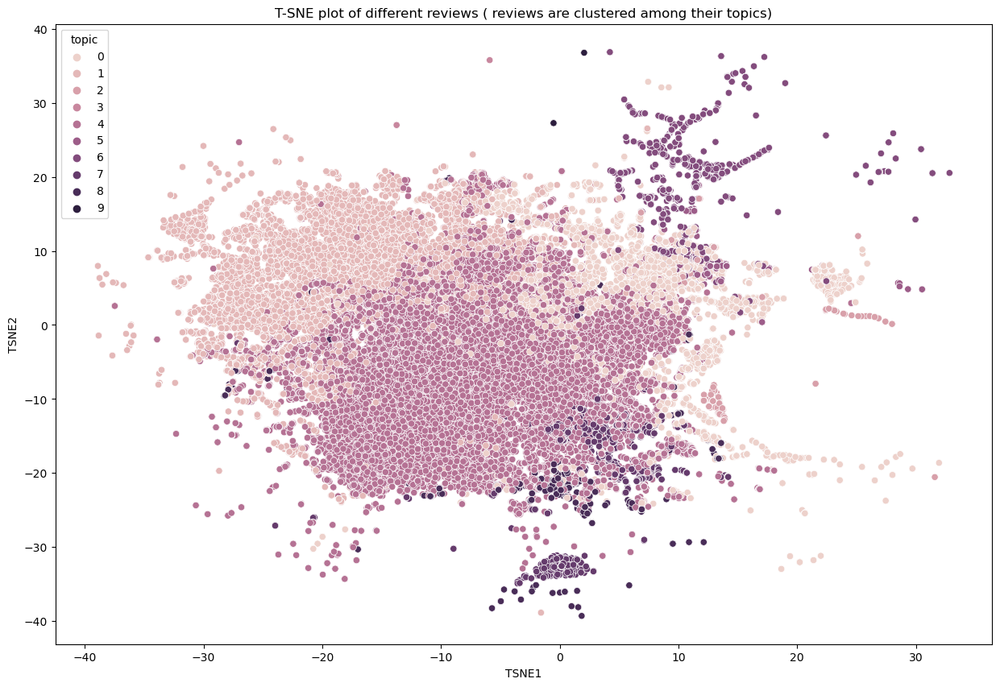

In [48]:
# will take a long time to run, hence please check the output by scrolling
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2,perplexity=50,learning_rate=100,n_iter=1000,random_state=0,angle=0.75)
tsne_features = tsne_model.fit_transform(new_dtm_reduced)
df_tsne = pd.DataFrame(tsne_features)
df_tsne['topic'] = labels_kmeans
df_tsne.columns = ['TSNE1', 'TSNE2', 'topic']
import seaborn as sns
plt.figure(figsize=(15, 10))
plt.title('T-SNE plot of different reviews ( reviews are clustered among their topics)')
ax = sns.scatterplot(x = 'TSNE1', y = 'TSNE2', hue = 'topic', data = df_tsne, legend = 'full')
plt.show()

In [51]:
terms=list(w2v_model.wv.index_to_key)

def selected_topics(model, top_n=10):
    for idx, topic in enumerate(model.cluster_centers_):
        print("Topic %d:" % (idx))
        print([(terms[i], str(round(topic[i],2))+"%") for i in topic.argsort()[:-top_n - 1:-1]]) 
selected_topics(kmeans)

Topic 0:
[('working', '0.13%'), ('service', '0.07%'), ('payment', '0.05%'), ('not', '0.05%'), ('worst', '0.02%'), ('no', '0.02%'), ('experience', '0.02%'), ('booked', '0.02%'), ('train', '0.02%'), ('unable', '0.01%')]
Topic 1:
[('nice', '0.02%'), ('service', '0.01%'), ('experience', '0.01%'), ('booked', '0.01%'), ('train', '0.01%'), ('day', '0.01%'), ('work', '0.0%'), ('try', '0.0%'), ('need', '0.0%'), ('one', '0.0%')]
Topic 2:
[('not', '0.67%'), ('payment', '0.03%'), ('money', '0.03%'), ('time', '0.02%'), ('please', '0.02%'), ('open', '0.01%'), ('experience', '0.01%'), ('no', '0.01%'), ('', '0.0%'), ('even', '0.0%')]
Topic 3:
[('good', '0.99%'), ('time', '0.24%'), ('experience', '0.06%'), ('money', '0.03%'), ('slow', '0.03%'), ('bad', '0.02%'), ('problem', '0.02%'), ('no', '0.01%'), ('always', '0.01%'), ('every', '0.01%')]
Topic 4:
[('payment', '0.07%'), ('worst', '0.05%'), ('money', '0.02%'), ('experience', '0.01%'), ('please', '0.01%'), ('always', '0.01%'), ('poor', '0.0%'), ('accou

In [53]:
doc_topics1 = pd.DataFrame(clusters_kmeans)
topics = 'TOPIC_' + pd.Series(list(range(0,10))).astype(str)
doc_topics1.columns = topics.tolist()
dominating_topic = []
sub_topic = []
for i in range(0,len(doc_topics1)):
    r = doc_topics1.loc[i,]
    dom_topic = r.sort_values(ascending=False).head(1).index[0] 
    sub_tp = " + ".join(list(r.sort_values(ascending=False)[1:5].index))
    dominating_topic.append(dom_topic)
    sub_topic.append(sub_tp)

dominating_topic = pd.Series(dominating_topic)
dominating_topic.name = "MAIN_TOPIC"
sub_topic = pd.Series(sub_topic)
sub_topic.name = "SUB_TOPICS"
doc_topics_emb = pd.concat([final,doc_topics1,dominating_topic,sub_topic],axis=1)

# placing topic against the documents
top_n=30
b=[]
b2=[]

for idx, topic in enumerate(kmeans.cluster_centers_):
    tt=[]
    tt2=[]
    tt.append([str(list(w2v_model.wv.index_to_key)[i])+" "+str(round(topic[i],2))+"%"
                        for i in topic.argsort()[:-top_n - 1:-1]])
    tt2.append([str(list(w2v_model.wv.index_to_key)[i]) for i in topic.argsort()[:-top_n - 1:-1]])
    b.append(', '.join(tt[0]))
    b2.append(', '.join(tt2[0]))


bb=pd.Series(b,index=topics).to_dict()
review_category = doc_topics_emb.MAIN_TOPIC.replace(bb)
review_category.name = 'review_category'

bb2=pd.Series(b2,index=topics).to_dict()
review_category2 = doc_topics_emb.MAIN_TOPIC.replace(bb2)
review_category2.name = 'review_category2'

doc_topics_emb['review_category'] = review_category
doc_topics_emb['review_category2'] = review_category2
# doc_topics_emb[doc_topics_emb.columns.difference(['content', 'reviewId', 'userName', 'userImage', 'score', 'thumbsUpCount', 'reviewCreatedVersion',
#  'at', 'replyContent', 'repliedAt', 'appVersion', 'sentiment_TextBlob', 'sentiment_TextBlob_outcome','SUB_TOPICS'])]
topics = 'TOPIC_' + pd.Series(list(range(0,10))).astype(str)
for x in topics:
    display(doc_topics_emb[doc_topics_emb.MAIN_TOPIC==x][['MAIN_TOPIC','translated_content','translated_content_cleaned','review_category2']].head(5))

,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
5,TOPIC_2,Walaikum assalam,,"not, payment, money, time, please, open, experience, no, , even, one, error, account, option, problem, day, many, deducted, issue, try, poor, always, show, showing, user, every, need, opening, booked, slow"
30,TOPIC_2,Ubyh,,"not, payment, money, time, please, open, experience, no, , even, one, error, account, option, problem, day, many, deducted, issue, try, poor, always, show, showing, user, every, need, opening, booked, slow"
116,TOPIC_2,Nyc apk,,"not, payment, money, time, please, open, experience, no, , even, one, error, account, option, problem, day, many, deducted, issue, try, poor, always, show, showing, user, every, need, opening, booked, slow"
119,TOPIC_2,Esey for use,,"not, payment, money, time, please, open, experience, no, , even, one, error, account, option, problem, day, many, deducted, issue, try, poor, always, show, showing, user, every, need, opening, booked, slow"
137,TOPIC_2,", o.8o",,"not, payment, money, time, please, open, experience, no, , even, one, error, account, option, problem, day, many, deducted, issue, try, poor, always, show, showing, user, every, need, opening, booked, slow"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
0,TOPIC_3,Best,best,"good, time, experience, money, slow, bad, problem, no, always, every, , opening, show, option, account, please, work, day, poor, error, need, train, try, showing, one, service, deducted, update, user, many"
1,TOPIC_3,Good,good,"good, time, experience, money, slow, bad, problem, no, always, every, , opening, show, option, account, please, work, day, poor, error, need, train, try, showing, one, service, deducted, update, user, many"
2,TOPIC_3,Good 👍,good,"good, time, experience, money, slow, bad, problem, no, always, every, , opening, show, option, account, please, work, day, poor, error, need, train, try, showing, one, service, deducted, update, user, many"
3,TOPIC_3,There are good apps for booking tickets but a good internet is required to book instant tickets,good good internet required instant,"good, time, experience, money, slow, bad, problem, no, always, every, , opening, show, option, account, please, work, day, poor, error, need, train, try, showing, one, service, deducted, update, user, many"
4,TOPIC_3,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,one pathetic trying download every time error,"good, time, experience, money, slow, bad, problem, no, always, every, , opening, show, option, account, please, work, day, poor, error, need, train, try, showing, one, service, deducted, update, user, many"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2
26812,TOPIC_5,After allowing all the require permission I still can't download my ticket,allowing require permission still download,"not, worst, booked, time, nice, good, no, even, slow, always, experience, problem, unable, need, opening, poor, error, showing, try, , user, service, deducted, work, show, option, update, many, train, account"
27247,TOPIC_5,"While the ticket booking is seamless when using BHIM UPI, same can't be said about credit cards. Similarly, inability to print or save ticket to gallery because of non-existent storage permission is a bother.",seamless said credit card similarly inability print save gallery non existent storage permission bother,"not, worst, booked, time, nice, good, no, even, slow, always, experience, problem, unable, need, opening, poor, error, showing, try, , user, service, deducted, work, show, option, update, many, train, account"
29882,TOPIC_5,Storage permission,storage permission,"not, worst, booked, time, nice, good, no, even, slow, always, experience, problem, unable, need, opening, poor, error, showing, try, , user, service, deducted, work, show, option, update, many, train, account"
32350,TOPIC_5,I can't download my ticket from this app after paying my money as it asks for storage permission everytime. Although all permission is accessible by this app.,download paying money asks storage permission permission accessible,"not, worst, booked, time, nice, good, no, even, slow, always, experience, problem, unable, need, opening, poor, error, showing, try, , user, service, deducted, work, show, option, update, many, train, account"
32409,TOPIC_5,Ticket pdf cannot be download without storage permission,download storage permission,"not, worst, booked, time, nice, good, no, even, slow, always, experience, problem, unable, need, opening, poor, error, showing, try, , user, service, deducted, work, show, option, update, many, train, account"


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


,MAIN_TOPIC,translated_content,translated_content_cleaned,review_category2


In [ ]:
# tried with smaller value of Topics: This was done in same cells, to keep code smaller and clean

# google news :  Trying K Means and LDA within each cluster

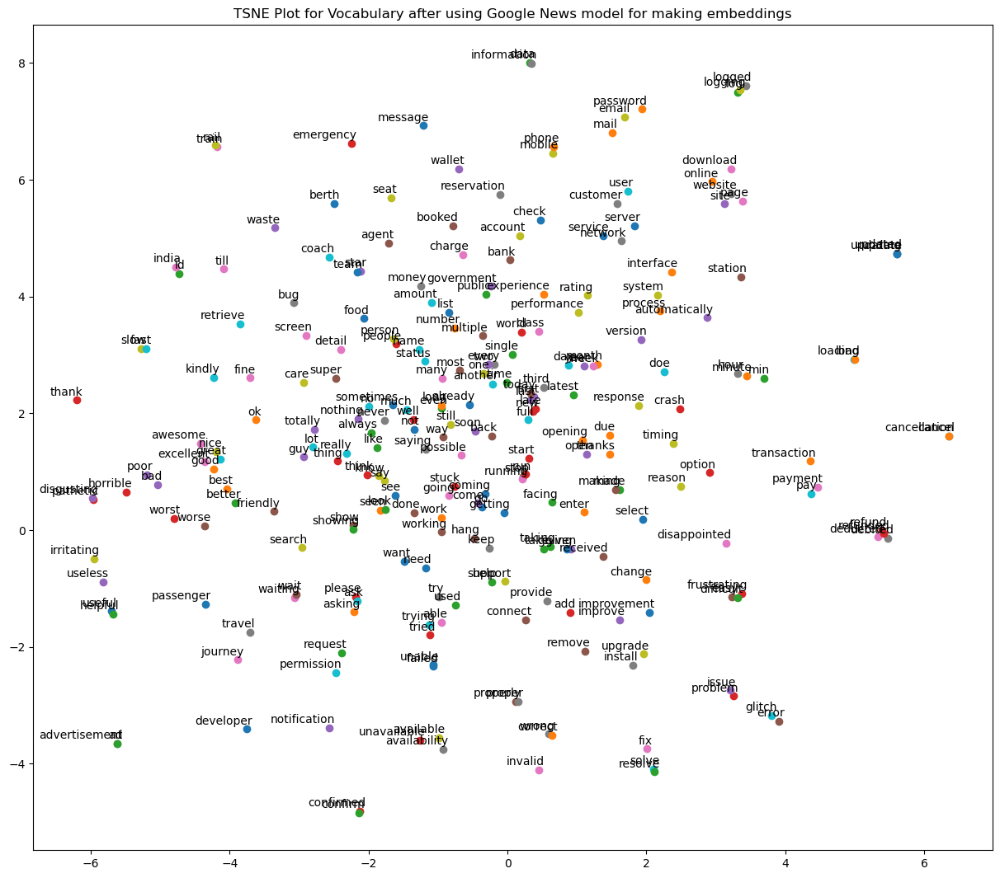

In [54]:
# try with google news data embedding
import gensim
pre_model = gensim.models.KeyedVectors.load_word2vec_format('models/GoogleNews-vectors-negative300.bin', binary=True)
# new_emb=pd.DataFrame()
# for x in new[new.columns.difference(['label','input_str','rectified_input_str','feature1','feature2','feature3'])].columns:
#     names=[x+f'_{v}' for v in range(0,300,1)]
#     new_emb=pd.concat([new_emb,pd.DataFrame(new[x].apply(lambda x: model.get_vector(int(x))).to_list(),columns=names)],axis=1)

# plotting TSNE for words we used in our Word2Vec for simple visual
tokens = final["translated_content_cleaned"].apply(lambda x: x.split(' '))

labels = []
tokens = []

for word in list(w2v_model.wv.index_to_key):
    try:
        tokens.append(pre_model.get_vector(word))
        labels.append(word)
    except:
        continue

tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=2000, random_state=23)
new_values = tsne_model.fit_transform(pd.DataFrame(tokens))

x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])

fig=plt.figure(figsize=(15, 13)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],
                 xy=(x[i], y[i]),
                 xytext=(5, 2),
                 textcoords='offset points',
                 ha='right',
                 va='bottom')
plt.title(label='TSNE Plot for Vocabulary after using Google News model for making embeddings')
plt.show()





In [55]:
# making our DTM using word2vec embeddings by averaging embedding for all words in a given document
import gensim
pre_model = gensim.models.KeyedVectors.load_word2vec_format('models/GoogleNews-vectors-negative300.bin', binary=True)

new_dtm_google=[]
for i, x in final[["translated_content_cleaned"]].iterrows():
    print(i,end='\r')
    words=x['translated_content_cleaned'].split(' ')
    temp=pre_model.get_mean_vector(words)
    new_dtm_google.append(temp)
new_dtm_google=pd.DataFrame(new_dtm_google)

In [56]:
import warnings
warnings.filterwarnings('ignore')
import pickle 
kmeans=KMeans(n_clusters=10, random_state=0)
cluster_labels=kmeans.fit_predict(new_dtm_google)

In [60]:
# do not run this as we have already have trained these models and stored them
lda_models = []
vect_objects=[]
topics_per_cluster = {}
documents=final['translated_content_cleaned'].to_list()
for cluster in range(10):
    cluster_docs = [documents[i] for i in range(len(documents)) if cluster_labels[i] == cluster]
    vectorizer = CountVectorizer()
    dtm = vectorizer.fit_transform(cluster_docs)
    lda = LatentDirichletAllocation(n_components=5, random_state=0)  # Choose the number of topics per cluster
    lda.fit(dtm)
    print('Cluster: ',cluster)
    print('log liklihood',lda.score(dtm))
    print('perplexity',lda.perplexity(dtm))
    lda_models.append(lda)
    with open(f'models/google_300_kmeans/vect_cluster{cluster}.pkl','wb') as f:
        pickle.dump(vectorizer,f)    
    #vect_objects.append(vectorizer)
    terms = vectorizer.get_feature_names_out()
    n_top_words = 5
    topics = []
    for topic_idx, topic in enumerate(lda.components_):
        top_words = [terms[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        topics.append(", ".join(top_words))
    topics_per_cluster[cluster] = topics
for cluster, topics in topics_per_cluster.items():
    print(f"\nCluster {cluster}:")
    for idx, topic in enumerate(topics):
        print(f"  Topic {idx}: {topic}")
with open('models/lda_models_approach3.pkl','wb') as f:
    pickle.dump(lda_models,f)


Cluster:  0
log liklihood -4770.696465621837
perplexity 10.824104761546153
Cluster:  1
log liklihood -357353.3002274595
perplexity 229.64152518189948
Cluster:  2
log liklihood -3096821.7195040453
perplexity 708.4596274327213
Cluster:  3
log liklihood -15500.836847204631
perplexity 23.12699093795698
Cluster:  4
log liklihood -22880.02073373497
perplexity 5.603616694656744
Cluster:  5
log liklihood -15997.027582810686
perplexity 17.745441315952146
Cluster:  6
log liklihood -2051.392681939748
perplexity 7.356013728891248
Cluster:  7
log liklihood -6677.9353515159
perplexity 11.949142179370387
Cluster:  8
log liklihood -2387.097972530354
perplexity 7.496443205600414
Cluster:  9
log liklihood -11312.016832249887
perplexity 7.308959339814914

Cluster 0:
  Topic 0: best, one, nice, option, wish
  Topic 1: best, good, easy, india, performance
  Topic 2: best, experience, reservation, travel, helpful
  Topic 3: best, rail, online, site, seller
  Topic 4: best, train, travelling, smooth, hotel



In [61]:
print(silhouette_score(new_dtm_google,kmeans.predict(new_dtm_google)))

0.3086092


In [ ]:
# importing the already trained model. Run as per your discretion
import pickle
with open('models/kmeans_approach3_google.pkl','rb') as f:
    kmeans=pickle.load(f)

with open('models/lda_models_approach3.pkl','wb') as f:
    lda_models=pickle.load(f)

In [62]:
def pred_cluster_and_topic(test_string):
    # with open('models/lda_models.pkl','rb') as f:
    #     n_lm=pickle.load(f)
    test_string_cleaned=clean_text(pd.Series(test_string))[0]
    test_obj=pd.DataFrame(pre_model.get_mean_vector(test_string.split(' '))).T
    c_pred=kmeans.predict(test_obj)
    test_model=lda_models[c_pred[0]]
    with open(f'models/google_300_kmeans/vect_cluster{c_pred[0]}.pkl','rb') as f:
        test_vect=pickle.load(f)
    dtm_test=test_vect.transform([test_string_cleaned])
    output=test_model.transform(dtm_test)
    #print(f'Cluster {c_pred[0]}'+' and topic_'+str(output.argmax())+' with proba: '+str(round(output.max(),3)))
    return c_pred[0],output.argmax(),output.max()

In [63]:
cluster,topic,proba=pred_cluster_and_topic('good app')
print('cluster: ',cluster,'topic: ',topic,' with probability=',proba)

cluster:  1 topic:  3  with probability= 0.5999968176826703


In [64]:
demo_df=pd.read_parquet('demo_df.parquet')

In [65]:
demo_df2=demo_df.groupby(['clusters','topics','words_in_topic'])[['clusters','topics','words_in_topic','content','translated_content']].head(3)

In [66]:
def t(string):
    cluster,topic,proba=pred_cluster_and_topic(string)
    return str('cluster: '+str(cluster)+'topic: '+str(topic)+' with probability='+str(proba))

In [67]:
demo_df2['output']=demo_df2['translated_content'].apply(lambda x: t(x))

In [68]:
demo_df2 #human checking reviews

,clusters,topics,words_in_topic,content,translated_content,output
0,9,1,"best, experience, good, one, easy",Best,Best,cluster: 0topic: 2 with probability=0.5932227644461392
1,1,1,"good, slow, nice, enough, okay",Good,Good,cluster: 3topic: 0 with probability=0.5999980298689461
2,1,1,"good, slow, nice, enough, okay",Good 👍,Good 👍,cluster: 3topic: 0 with probability=0.5999980298689461
3,6,1,"time, worst, not, server, every",Ticket book karne ke liye achha apps hai lekin tatkal tickets book karne ke liye achha net ki jarurat hai,There are good apps for booking tickets but a good internet is required to book instant tickets,cluster: 2topic: 0 with probability=0.5851719955986292
4,6,1,"time, worst, not, server, every",One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,cluster: 2topic: 1 with probability=0.8962765201387567
...,...,...,...,...,...,...
64240,9,0,"best, think, absolutely, amazing, public",make easiest usefull.,make easiest usefull.,cluster: 1topic: 4 with probability=0.5999920324792262
65316,8,3,"ji, gee, ok, sir, well",Gigh,Gee,cluster: 2topic: 0 with probability=0.2
75399,8,3,"ji, gee, ok, sir, well",Ok hai bhiji,ok hai bhi ji,cluster: 2topic: 3 with probability=0.7294763986572755
78450,2,1,"super, star, travelling, personal, sir",super travelling app that's,super travelling app that's,cluster: 2topic: 3 with probability=0.5085413954712523


In [70]:
# do not run as it will take long time to run. Results can be seen the output
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, perplexity=50, learning_rate=100, 
                        n_iter=1000, random_state=0, angle=0.75)
tsne_features = tsne_model.fit_transform(new_dtm_google)
df_tsne = pd.DataFrame(tsne_features)
df_tsne['clusters'] = cluster_labels
df_tsne.columns = ['TSNE1', 'TSNE2', 'clusters']


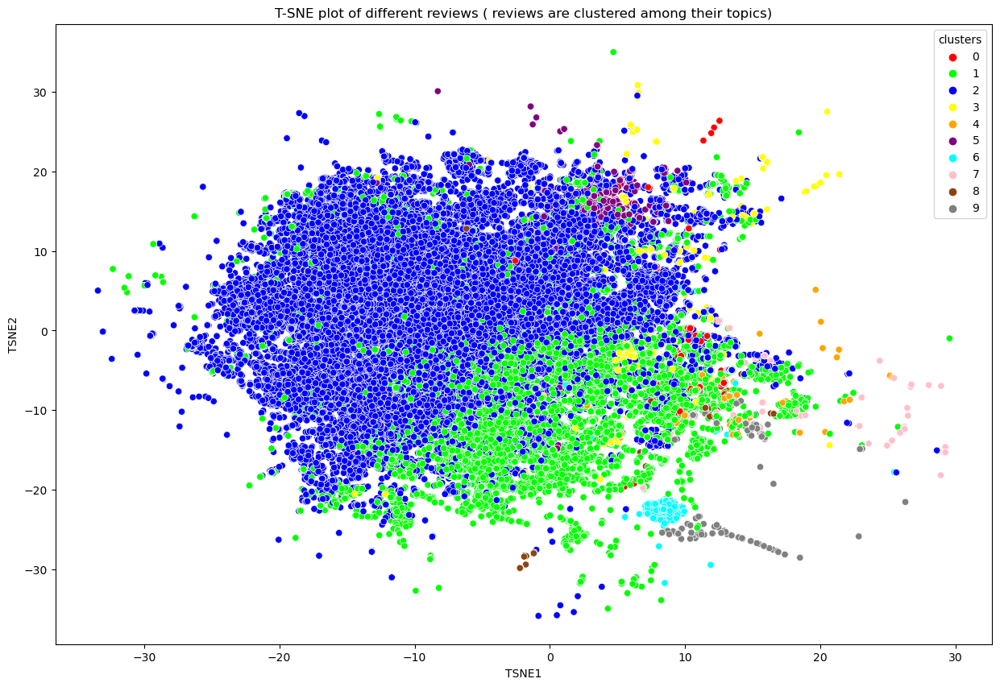

In [72]:
import seaborn as sns
plt.figure(figsize=(15, 10))
plt.title('T-SNE plot of different reviews ( reviews are clustered among their topics)')
ax = sns.scatterplot(x = 'TSNE1', y = 'TSNE2', hue = 'clusters', data = df_tsne, legend = 'full',palette = [
  "#FF0000",  # Red
    "#00FF00",  # Green
    "#0000FF",  # Blue
    "#FFFF00",  # Yellow
    "#FFA500",  # Orange
    "#800080",  # Purple
    "#00FFFF",  # Cyan
    "#FFC0CB",  # Pink
    "#8B4513",  # Brown
    "#808080",  # Gray
    "#008000",  # Dark Green
    "#4B0082",  # Indigo
    "#FF1493",  # Deep Pink
    "#008080",  # Teal
    "#FF4500",  # Orange Red
    "#DA70D6",  # Orchid
    "#7FFF00",  # Chartreuse
    "#DC143C",  # Crimson
    "#B8860B",  # Dark Goldenrod
    "#4682B4"   # Steel Blue
])
plt.show()

# bert_100


In [357]:
HDBSCAN?

Init signature:
HDBSCAN(
    min_cluster_size=5,
    min_samples=None,
    cluster_selection_epsilon=0.0,
    max_cluster_size=0,
    metric='euclidean',
    alpha=1.0,
    p=None,
    algorithm='best',
    leaf_size=40,
    memory=Memory(location=None),
    approx_min_span_tree=True,
    gen_min_span_tree=False,
    core_dist_n_jobs=4,
    cluster_selection_method='eom',
    allow_single_cluster=False,
    prediction_data=False,
    branch_detection_data=False,
    match_reference_implementation=False,
    **kwargs,
)
Docstring:     
Perform HDBSCAN clustering from vector array or distance matrix.

HDBSCAN - Hierarchical Density-Based Spatial Clustering of Applications
with Noise. Performs DBSCAN over varying epsilon values and integrates
the result to find a clustering that gives the best stability over epsilon.
This allows HDBSCAN to find clusters of varying densities (unlike DBSCAN),
and be more robust to parameter selection.

Parameters
----------
min_cluster_size : int, optional 

In [ ]:
# do not run this cell, as we have already trained this model and results are shared. This will take time to run with different initialization
import umap
from hdbscan import HDBSCAN
from bertopic import BERTopic
documents=final['translated_content_cleaned'].to_list()
umap_model = umap.UMAP(n_neighbors=30, n_components=5, min_dist=0.0, metric='cosine')
hdbscan_model = HDBSCAN(min_cluster_size=15, min_samples=5, metric='euclidean',prediction_data = True)


bert_model=BERTopic(nr_topics=100,n_gram_range=(1,2),umap_model=umap_model,hdbscan_model=hdbscan_model)
bert_topics,proba=bert_model.fit_transform(documents)


In [73]:
# reading the model we trained by above code
with open('models/bert_model_100.pkl','rb') as f:
    bert_model=pickle.load(f)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


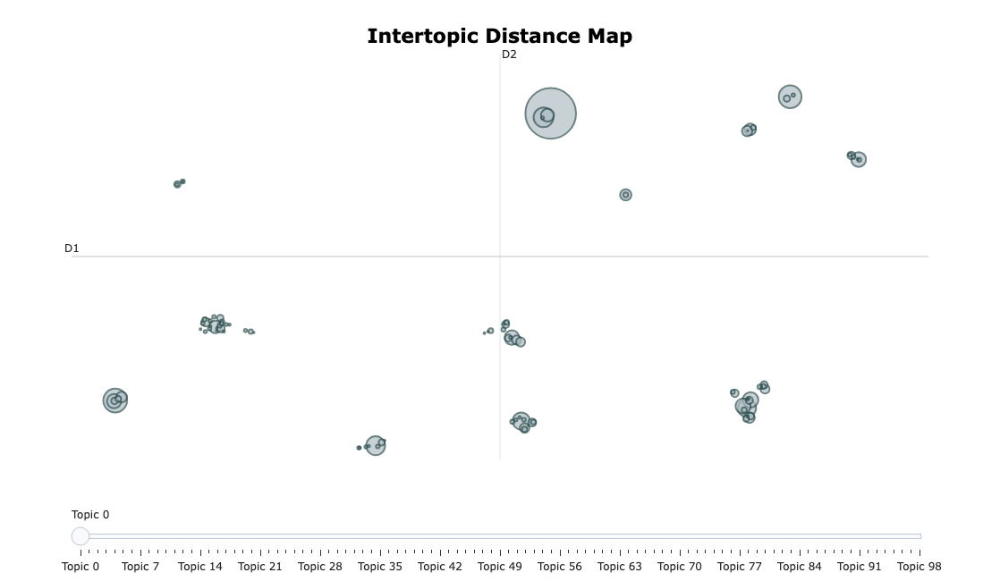

In [74]:
bert_model.visualize_topics()

In [76]:
file=open("bert_model_intertopic_dist.html", "w")
file.write(bert_model.visualize_topics().to_html())

3808383

In [77]:
bert_model_100.topic_labels_

{-1: '-1_time_payment_money_not',
 0: '0_good good_good_nice_nice good',
 1: '1_worst worst_bad worst_worst bad_worst',
 2: '2_payment_booked_money_refund',
 3: '3_not not_right_not no_no not',
 4: '4_slow_slow slow_performance_lag',
 5: '5_open_opening_not opening_not open',
 6: '6_seat_train_berth_food',
 7: '7_not working_working_working not_properly not',
 8: '8_update_upgrade_update not_play',
 9: '9_password_account_register_id',
 10: '10_service_good service_service good_bad service',
 11: '11_experience_bad experience_experience bad_experience worst',
 12: '12_ok_ok ok_awesome_awesome ok',
 13: '13_super_super super_superb_super superb',
 14: '14_useful_helpful_useful useful_helpful useful',
 15: '15_ad_advertisement_many ad_many',
 16: '16_waste_useless_useless useless_useless waste',
 17: '17_retrieve_data_retrieve data_unable retrieve',
 18: '18_easy_friendly_user friendly_user',
 19: '19_rail_rail connect_connect_train',
 20: '20_server_maintenance_worst server_online',
 21

In [156]:
bert_mapping={-1: 'Payment, Money and Slow-loading Related Issues',
 0: 'Positive Reviews',
 1: 'Negative Reviews',
 2: 'Payment, Money and Refund Related',
 3: 'Vague',
 4: 'Performance related Review',
 5: 'App load/opening related issues and reviews',
 6: 'Seat type/booking, preference and food related reviews',
 7: 'Negative Reviews',
 8: 'Update/Upgrade related reviews',
 9: 'Account, Login Credentials/Password, Registration related reviews',
 10: 'Service Related Review', # mention it can be positive or negative, hence we derive sentiment analysis P/N
 11: 'user experience related review', # P/N
 12: 'General Positive Reviews',
 13: 'Positive Reviews',
 14: 'Positive Review speaking of usefullness/helpful/informative features',
 15: 'Advertisement related problems and reviews',
 16: 'Negative Reviews',
 17: 'Technical problem in opening/accessing mobile app and data',
 18: 'Positive review about user friendly UI/UX',
 19: 'General Reviews', #issue P/N
 20: 'General Review about online platform',#issue P/N
 21: 'Login related issues/reviews',
 22: 'Reviews related to technical bugs/glitches',
 23: 'General Poor Reviews', # "low price" replace in clean_func # issue
 24: 'Station Names and other boarding details related reviews',
 25: 'Email/OTP/Mobile Number Verification and validation related reviews',
 26: 'General Poor Reviews',
 27: 'Vague',
 28: 'General Reviews',#issue P/N
 29: 'App crash and emergency/tatkal feature related reviews',
 30: 'Reviews addressing India or States of India, Indian Railways Dept. and their services',
 31: 'App repsonsiveness and Customer Care and Complaints related reviews',
 32: 'Reviews addressing rating of the app and its services',
 33: 'Internet connection related reviews',
 34: 'Negative Reviews',
 35: 'Negative Reviews',
 36: 'Negative Reviews',
 37: 'App hanging related reviews',
 38: 'Train and IRCTC services- related reviews addressing general and cleanliness related problems',
 39: 'Different Error popups in the application and mobile permissions related reviews',
 40: 'Journey and Travel related reviews',
  41: 'Negative Reviews', #related to download
 42: 'Reliability related positive reviews',
 43: 'Negative Reviews',#irrititating related
 44: 'Interface Related Reviews',
 45: 'Notifications and Advertisements related reviews',
 46: 'Searching feature and current ticket/seats status related reviews',
 47: 'Vague',
 48: 'Negative feedback on App development process and other UI related reviews',
 49: 'Various/New Features related reviews',
 50: 'Master List (feature) related reviews',
  51: 'Negative Reviews',
 52: 'Unauthorized Device/Access and Invalid Requests related reviews',
 53: 'Negative Reviews',
 54: 'General Reviews', #P/N
 55: 'Advertisement related problems and reviews',
 56: 'Positive Reviews',
 57: 'Platform/System related general reviews',
 58: 'Negative Reviews',
 59: 'Train chart rleated reviews',
 60: 'ticket confirmation related reviews',
  61: 'Pin, Captcha and biometric related problems/reviews',
 62: 'App buffereing related issues',
 63: 'Postive Reviews',
 64: 'Review related to duration/years of the application',
 65: 'User satisfaction related reviews',
 66: 'Ticket and Hidden/Extra charges related reviews',
 67: 'Vague',
 68: 'General Reviews',
 69: 'User disatisfaction/satisfaction related reviews',
 70: 'General Reviews',
 71: 'General Reviews referring to app support',
 72: 'Vague',
 73: 'Railway coaches related reviews',
 74: 'Reviews referring to smoothness of app experience',
 75: 'General Positive Reviews',
 76: 'General user experience of different facilities reviews',
 77: 'Different Quotas Related Reviews/Issues',
 78: 'Vague',
 79: 'General experience/comfort related reviews',
 80: 'Information/Ticket Details related Reviews',
 81: 'Vague',
 82: 'Negative Reviews', # spelling west-waste
 83: 'General Reviews',
 84: 'Vague',
 85: 'Signup/Signin Related Reviews',
 86: 'Positive Reviews',
 87: 'Font Size related reviews',
 88: 'Postive Reviews', # spelling excellent- exile
 89: 'Negative Reviews',
 90: 'Dark Mode/Theme related reviews',
 91: 'Different functions related reviews',
 92: 'Reviews comparing counter ticket vs app',
 93: 'Vague',
 94: 'AC related reviews',
 95: 'Vague',
 96: 'Print feature related reviews',
 97: 'automatic logout/activity related reviews',
 98: 'General Reviews'}

In [112]:
pd.Series(bert_mapping.values()).sort_values().nunique()

66

In [139]:
test_df[['reviewId','content','translated_content','bert_topic','proba','Our_Label_of_Topic','sentiment']].to_csv('lablled_data_to_verify.csv',index=False)

In [211]:
pd.Series(bert_mapping).nunique()

66

In [269]:
test_df=pd.read_parquet('test_df.parquet')
test_df['Our_Label_of_Topic']=test_df['bert_topic'].apply(lambda x:bert_mapping[x] )

In [121]:
test_df[test_df.bert_topic==98][['content','translated_content_cleaned','bert_topic','proba']]


,content,translated_content_cleaned,bert_topic,proba
11286,Out standing,standing,98,1.0
13404,Out standing,standing,98,1.0
24295,Bahut sundar mere liye ye shi hai jis se mere ticket jaldi mil jate hai or mere ko lines me bhi nhi lagna padta thanks 👍,nice quickly even stand line thanks,98,1.0
24670,It is faster to stand in a line to book a ticket than to do on this app.,faster stand line,98,1.0
35492,Out standing,standing,98,1.0
54436,This is the worst app . It's better to stand in line for 3 hours to book tatkal ticket rather than using this app .,worst better stand line hour rather,98,1.0
61646,Out standing 🫶🫶,standing,98,1.0
63299,Govt should do something about schedule of railways I am standing for 3 hours....,schedule standing hour,98,1.0
64463,बहुत अच्छा है लाइन में खड़े होने से छुटकारा है,great no need stand line,98,1.0
74688,ticket ke line m lagne ke jarorat nhi,no need stand line,98,1.0


In [82]:
test_df['Our_Label_of_Topic']=test_df['bert_topic'].apply(lambda x: bert_mapping[x])

In [122]:
test_df[test_df.bert_topic.isin([-1,4,5,6,7,8,3,45,32,89])][['content','translated_content','translated_content_cleaned','bert_topic','Our_Label_of_Topic','proba']].groupby(['bert_topic']).head(2)#.to_csv('lablled_data_to_verify.csv',index=False)

,content,translated_content,translated_content_cleaned,bert_topic,Our_Label_of_Topic,proba
4,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,one pathetic trying download every time error,-1,"Payment, Money and Slow-loading Related Issues",0.000000
5,Walaikum assalam,Walaikum assalam,,3,Vague,1.000000
15,ALWAYS AMOUNT DEDUCTED FROM MY ACCOUNT BUT TICKETS NOT ISSUED....! MANY TIMES THIS HAPPENING..... CORRECT THIS PROBLEM....!,ALWAYS AMOUNT DEDUCTED FROM MY ACCOUNT BUT TICKETS NOT ISSUED....! MANY TIMES THIS HAPPENING..... CORRECT THIS PROBLEM....!,always amount deducted account not issued many time happening correct problem,-1,"Payment, Money and Slow-loading Related Issues",0.000000
21,Always hangs and lags often never work smoothly,Always hangs and lags often never work smoothly,always hang lag often never work smoothly,4,Performance related Review,1.000000
30,Ubyh,Ubyh,,3,Vague,1.000000
32,it is my MAJBOORI to ise this app otherwise i would have never installed it. It is torture to use this app.,it is my MAJBOORI to ise this app otherwise i would have never installed it. It is torture to use this app.,never installed torture,5,App load/opening related issues and reviews,0.543442
37,"I always opt for window seat and I get asile seat and it's so irritating that I don't get seat of my choice when I get option to select my seat. It's absolutely ridiculous system, please correct your nonsense application.","I always opt for window seat and I get asile seat and it's so irritating that I don't get seat of my choice when I get option to select my seat. It's absolutely ridiculous system, please correct your nonsense application.",always opt window seat seat irritating seat choice option select seat absolutely ridiculous system please correct nonsense,6,"Seat type/booking, preference and food related reviews",1.000000
42,Excellent performance App,Excellent performance App,excellent performance,4,Performance related Review,1.000000
44,Best for train reservation,Best for train reservation,best train reservation,6,"Seat type/booking, preference and food related reviews",1.000000
80,"Asking for update after some time again and again , app is not working properly","Asking for update after some time again and again , app is not working properly",asking update time not working properly,8,Update/Upgrade related reviews,0.906354


In [79]:
# Plotting Topic Embeddings
from sklearn.manifold import TSNE
tsne_model = TSNE(perplexity=50, n_components=2, init='pca', n_iter=2000, random_state=23)
new_values = tsne_model.fit_transform(pd.DataFrame(bert_model.topic_embeddings_))
labels=bert_model.generate_topic_labels()
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])



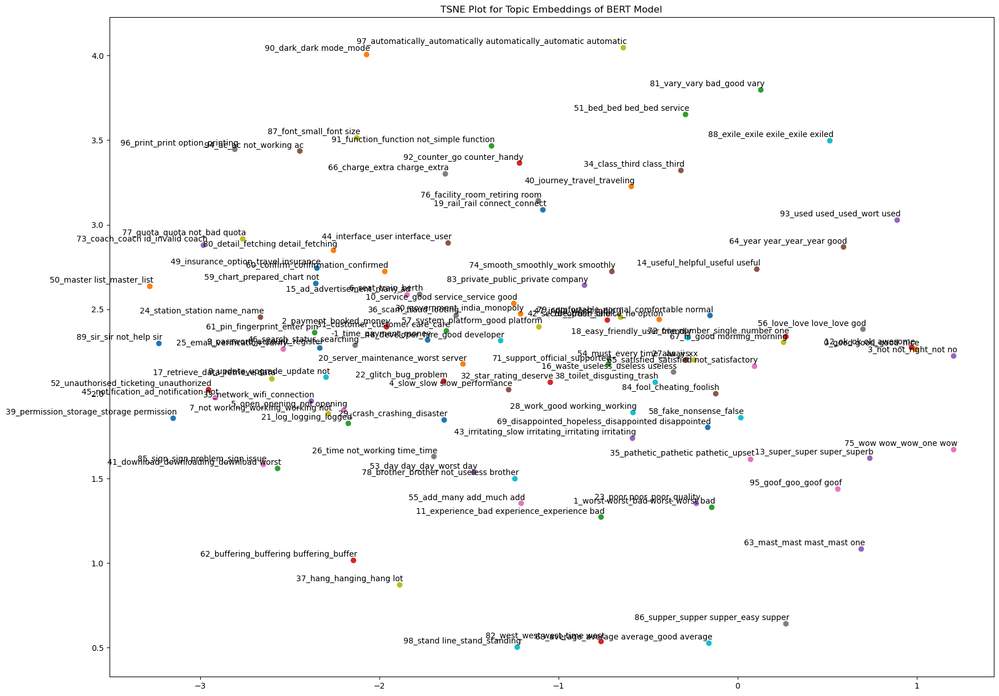

In [82]:

fig=plt.figure(figsize=(20, 15)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],
                 xy=(x[i], y[i]),
                 xytext=(5, 2),
                 textcoords='offset points',
                 ha='right',
                 va='bottom')
plt.title(label='TSNE Plot for Topic Embeddings of BERT Model')
plt.show()

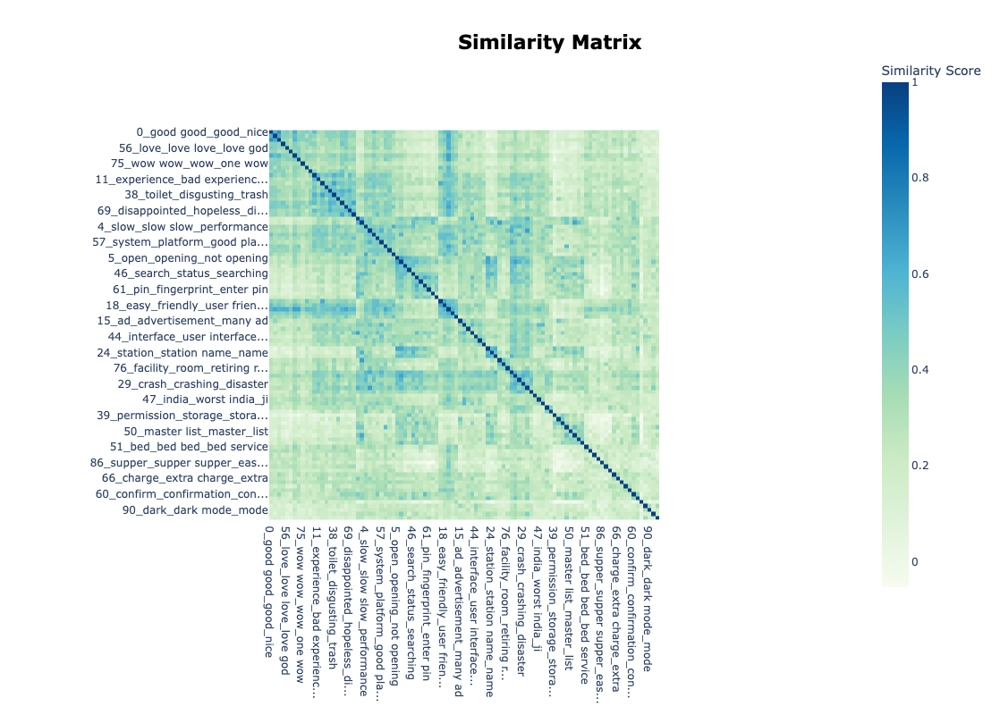

In [87]:
bert_model.visualize_heatmap(n_clusters = 20)


In [ ]:
topics, _ = topic_model.trantransform(documents)

In [290]:
embeddings = bert_model.transform(documents)[1]

array([[  0.53606355,  12.248272  ,   4.6432137 ,   2.4732537 ,
        -12.228436  ],
       [-12.195416  ,   5.223799  ,   2.48837   ,   9.530065  ,
          8.595771  ],
       [-12.223076  ,   5.1633782 ,   2.4122212 ,   9.577458  ,
          8.596805  ],
       ...,
       [  8.892309  ,   9.284337  ,   9.721831  ,   9.22569   ,
          1.3946538 ],
       [  9.190113  ,   9.021727  ,  10.278256  ,   9.493046  ,
          0.8041038 ],
       [  5.6458263 ,  10.501994  ,   7.674762  ,   8.813848  ,
          1.2439572 ]], dtype=float32)

In [302]:
bert_topics=test_df['bert_topic'].to_list()

In [349]:
embeddings=bert_model.embedding_model.embed_documents(documents)

In [354]:
filtered_embeddings = [embeddings[i] for i in range(len(new_values)) if bert_topics[i] != -1]
filtered_topics = [bert_topics[i] for i in range(len(new_values)) if bert_topics[i] != -1]

In [355]:
print(silhouette_score(filtered_embeddings,filtered_topics))

0.21864341


In [353]:
print(silhouette_score(embeddings,bert_topics))

0.16305925


In [313]:
bert_model.hdbscan_model.outlier_scores_

array([0.19867345, 0.12095686, 0.3102732 , ..., 0.01735624, 0.        ,
       0.50979671])

In [322]:
np.mean(bert_model.hdbscan_model.cluster_persistence_)

0.036164764432291864

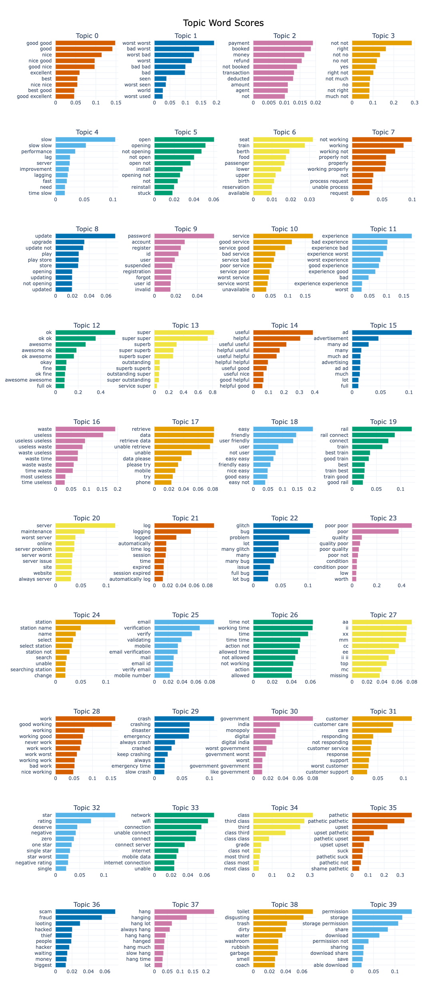

In [88]:
bert_model.visualize_barchart(top_n_topics = 40, n_words = 10)

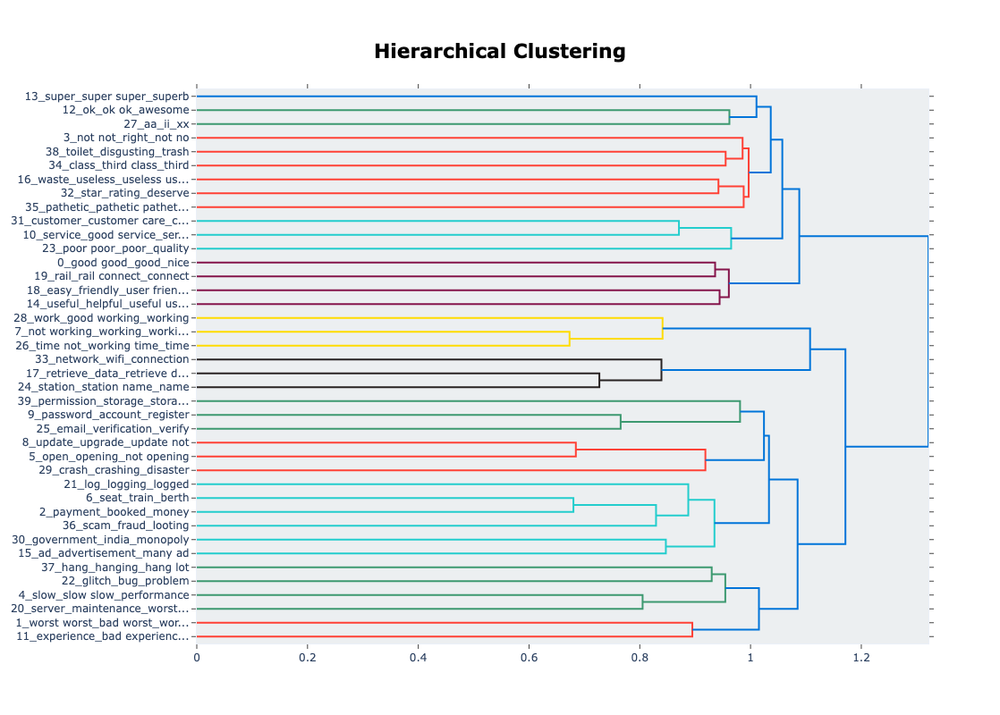

In [89]:

bert_model.visualize_hierarchy(top_n_topics=40)

In [ ]:
harsh_classes.columns=['topic_num','l1','l2','l3']
harsh_classes['l3']=bert_mapping.values()

In [175]:
harsh_classes=pd.read_csv('harsh_class.csv')



In [177]:
harsh_classes.columns=['topic','l1','l2','l3']

In [183]:
harsh_classes.groupby(['l1','l2'])['l3'].unique().reset_index()

,l1,l2,l3
0,Ambiguous or Vague,Ambiguous or Vague,[Vague]
1,General Reviews,Booking and Travel Features,[Information/Ticket Details related Reviews]
2,General Reviews,Features and Usefulness,"[Various/New Features related reviews, Master List (feature) related reviews, Different functions-related reviews]"
3,General Reviews,General Review,[General Reviews]
4,General Reviews,Platform Experience,"[General Review about online platform, Platform/System related general reviews, Review related to duration/years of the application, General Reviews referring to app support]"
5,General Reviews,Service Experience,"[Service Related Review, Reviews addressing India or States of India, Indian Railways Dept. and their services, Reviews addressing rating of the app and its services, Railway coaches-related reviews, General user experience of different facilities reviews, Reviews comparing counter ticket vs app]"
6,General Reviews,Travel Experience,"[Journey and Travel related reviews, General experience/comfort related reviews]"
7,General Reviews,UI/UX Experience,"[Interface Related Reviews, Font Size related reviews, Dark Mode/Theme-related reviews]"
8,General Reviews,User Experience,[User experience related review]
9,General Reviews,User Satisfaction,"[User satisfaction-related reviews, User dissatisfaction/satisfaction related reviews]"


In [181]:
harsh_classes.groupby(['l1','l2'])['l3'].unique().reset_index().to_csv('overall_aggregating_harsh_classes.csv',index=False)

# sentiment analysis

score,1,2,3,4,5
sentiment_outcome,,,,,
Negative,27002.0,1852.0,863.0,380.0,471.0
Positive,26077.0,3932.0,4095.0,6552.0,28776.0


,content,translated_content,score,sentiment_
518,After Amount deduction failure to processing ticket and they said amount will be given in 3-4 working days But I am looking for emergency purpose how I will be manege my amount,After Amount deduction failure to processing ticket and they said amount will be given in 3-4 working days But I am looking for emergency purpose how I will be manege my amount,5,-0.316667
605,"Message is coming, as unable to retrieve data, try again. The same message coming for the past two days. Till not working.","Message is coming, as unable to retrieve data, try again. The same message coming for the past two days. Till not working.",5,-0.375000
733,If booking tatkal ticket then processing take more time and show to the screen on mobile unable to retrieve data. Solve the problem Sir .,If booking tatkal ticket then processing take more time and show to the screen on mobile unable to retrieve data. Solve the problem Sir .,5,-0.500000
979,Slow your platform service,Slow your platform service,5,-0.300000
1033,Hey developer how we contact with you please tell I mean I want to ask you something,Hey developer how we contact with you please tell I mean I want to ask you something,5,-0.312500


Positive---------------------------------------------------------------------------------------


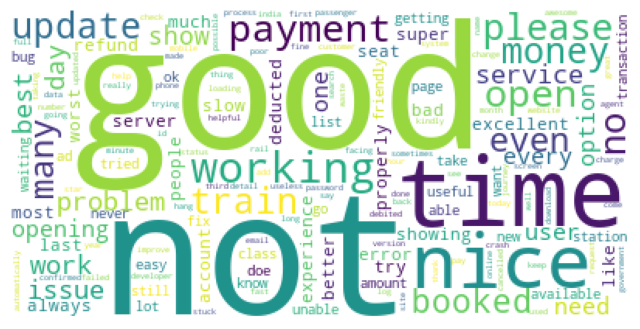

Negative---------------------------------------------------------------------------------------


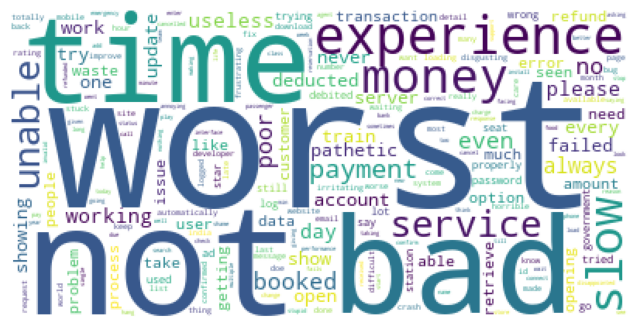

In [115]:
# Sentiment Analysis-
final2=final.copy()
final2['sentiment_'] = final2["translated_content_cleaned"].apply(lambda x: TextBlob(x).sentiment.polarity )          
final2['sentiment_outcome'] = np.where(final2.sentiment_>-0.2,'Positive', 'Negative')
ana=pd.pivot_table(data=final2.groupby(['sentiment_outcome'])['score'].value_counts().reset_index(),index='sentiment_outcome',columns='score',values='count')
display(ana)
display(final2[(final2.sentiment_outcome=='Negative')&(final2.score==5)][['content','translated_content','score','sentiment_']].head(5))
# display(final2[(final2.sentiment_outcome=='Positive')&(final2.score==1)][['content','translated_content','score','sentiment_']].head(5))
# makes sense, but still some noisy data- as shown by example- 
#they have given bas review, but given score 5- hence our model is good at predicting sentiment better


# but issue in negative reviews being classified as poisitive
print('Positive---------------------------------------------------------------------------------------')
# creating wordclouds for neutral sentiment reviews
wordcloud = WordCloud(background_color='white', stopwords=stop_words)
countvect_wc = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1, 1 ), min_df=5, encoding='latin-1',max_features=800)
df1_count_wc = countvect_wc.fit_transform(final2[final2.sentiment_outcome=='Positive']['translated_content_cleaned'])
dtm_df1_wc=df1_count_wc.toarray()
dtm_df1_wc=pd.DataFrame(dtm_df1_wc, columns=countvect_wc.get_feature_names_out())
word_freq = dict(dtm_df1_wc.apply(sum))
wordcloud = wordcloud.generate_from_frequencies(word_freq)   # from word frequency
fig = plt.figure(1, figsize=(8, 5))
plt.axis('off')
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 200
plt.imshow(wordcloud)    # function to display data as image
plt.show() 

print('Negative---------------------------------------------------------------------------------------')
# creating wordclouds for negative sentiment reviews
wordcloud = WordCloud(background_color='white', stopwords=stop_words)
countvect_wc = CountVectorizer(analyzer='word', token_pattern=r'\w{1,}',ngram_range=(1, 1 ), min_df=5, encoding='latin-1',max_features=800)
df1_count_wc = countvect_wc.fit_transform(final2[final2.sentiment_outcome=='Negative']['translated_content_cleaned'])
dtm_df1_wc=df1_count_wc.toarray()
dtm_df1_wc=pd.DataFrame(dtm_df1_wc, columns=countvect_wc.get_feature_names_out())
word_freq = dict(dtm_df1_wc.apply(sum))
wordcloud = wordcloud.generate_from_frequencies(word_freq)   # from word frequency
fig = plt.figure(1, figsize=(8, 5))
plt.axis('off')
#import matplotlib as mpl
#mpl.rcParams['figure.dpi']= 200
plt.imshow(wordcloud)    # function to display data as image
plt.show()


In [114]:
# with embeddings
from transformers import pipeline
sentiment_analyzer = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [123]:
# make avg sentiment of topics plots
test_df['actual_score']=np.where(test_df.sentiment=='POSITIVE',test_df.sentiment_score,-1*test_df.sentiment_score,)
avg_sent=test_df.groupby(['Our_Label_of_Topic'])['actual_score'].mean()
avg_sent=avg_sent.reset_index()

In [127]:
test_df[['content','sentiment','sentiment_score','Our_Label_of_Topic','bert_topic']].groupby(['bert_topic']).head(1)

,content,sentiment,sentiment_score,Our_Label_of_Topic,bert_topic
0,Best,POSITIVE,0.999794,Positive Reviews,0
3,Ticket book karne ke liye achha apps hai lekin tatkal tickets book karne ke liye achha net ki jarurat hai,POSITIVE,0.999566,General Review about online platform,20
4,One of the pathetic app to use. Trying to re-download my ticket from app and every time there is an error.,NEGATIVE,0.999728,"Payment, Money and Slow-loading Related Issues",-1
5,Walaikum assalam,POSITIVE,0.748121,Vague,3
6,Very comfortable,POSITIVE,0.999855,General experience/comfort related reviews,79
...,...,...,...,...,...
7425,तत्काल बुकिंग का समय चुटिया बनाता है लुगो को 🗿🤬,NEGATIVE,0.999520,Vague,84
7746,Best to use Railway counter... Worst app,NEGATIVE,0.995232,Reviews comparing counter ticket vs app,92
7981,Why you have ads? Allow to change/increase the font size.,POSITIVE,0.835545,Font Size related reviews,87
8735,Unable to print tkt,NEGATIVE,0.999579,Print feature related reviews,96


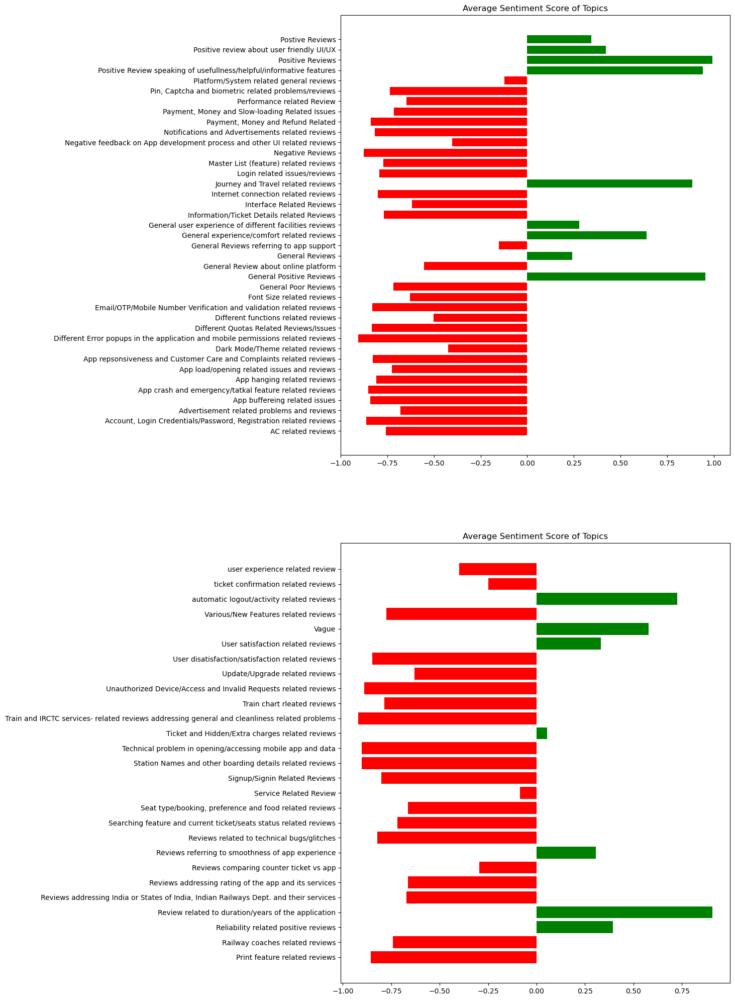

In [124]:
fig,ax =plt.subplots(2,1,figsize=(10,25))
ax[0].barh(avg_sent['Our_Label_of_Topic'].iloc[0:39],avg_sent['actual_score'].iloc[0:39],color=['green' if v > 0 else 'red' for v in avg_sent['actual_score'].iloc[0:39]])
ax[0].set_title('Average Sentiment Score of Topics')
ax[1].barh(avg_sent['Our_Label_of_Topic'].iloc[39:],avg_sent['actual_score'].iloc[39:],color=['green' if v > 0 else 'red' for v in avg_sent['actual_score'].iloc[39:]])
ax[1].set_title('Average Sentiment Score of Topics')
plt.show()

In [132]:
topics_b=test_df.Our_Label_of_Topic.unique()

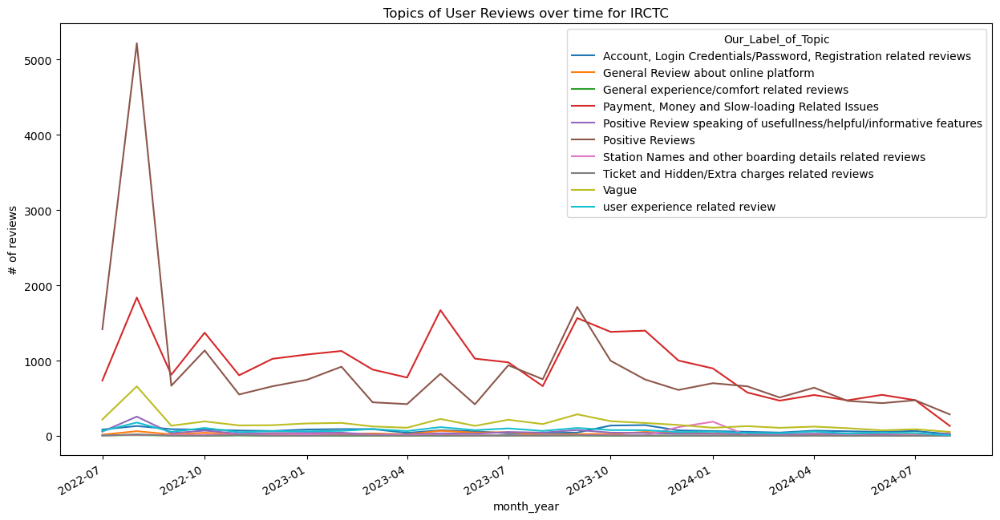

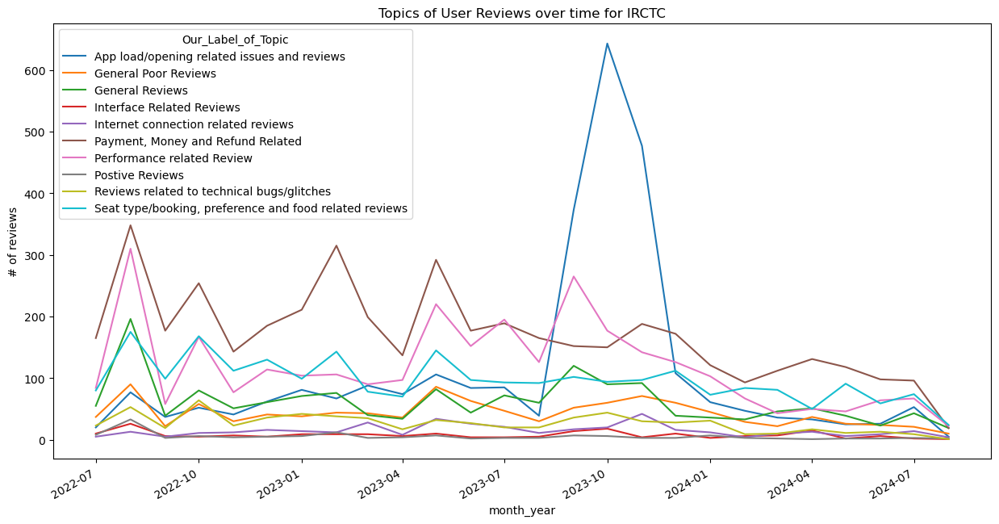

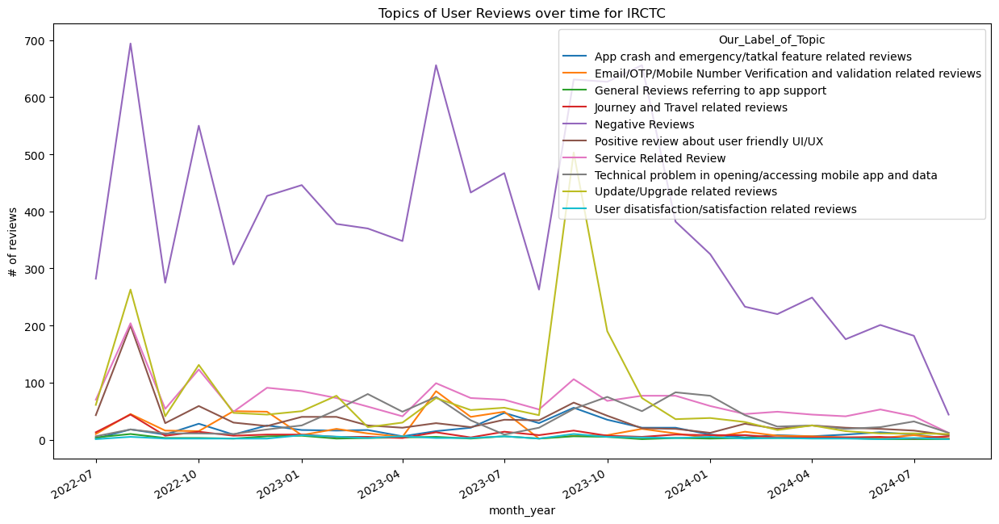

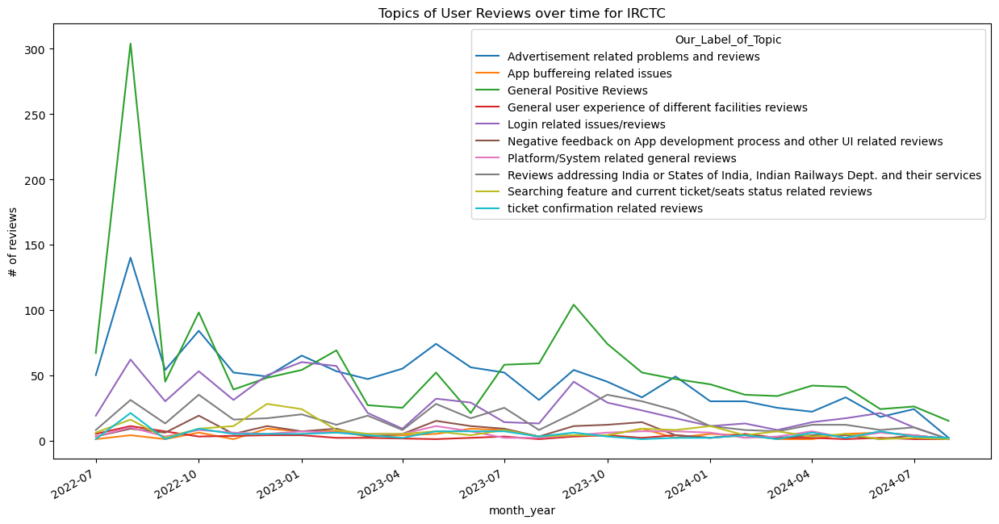

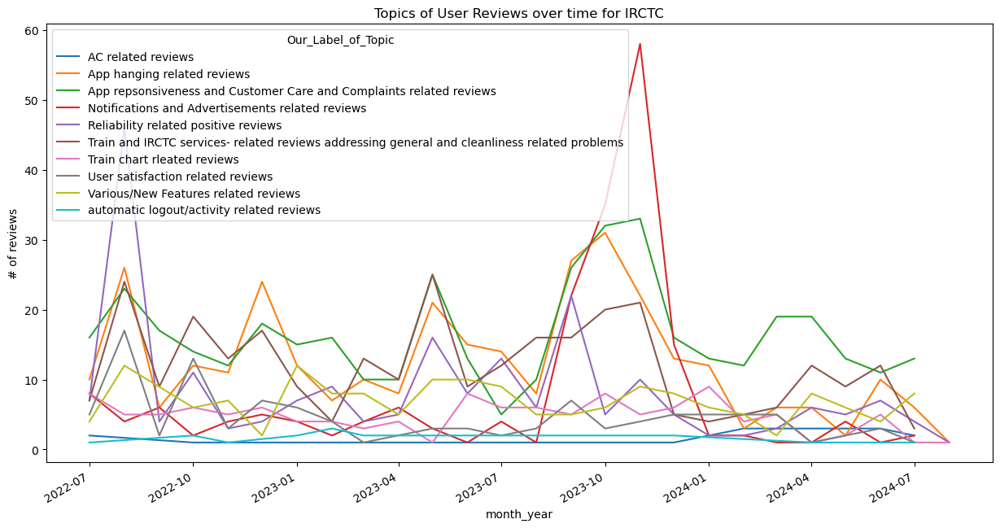

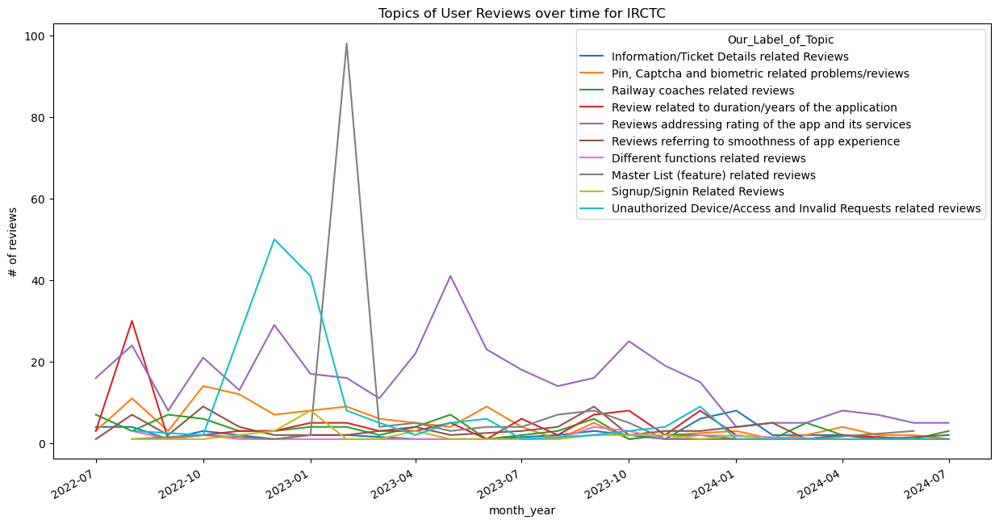

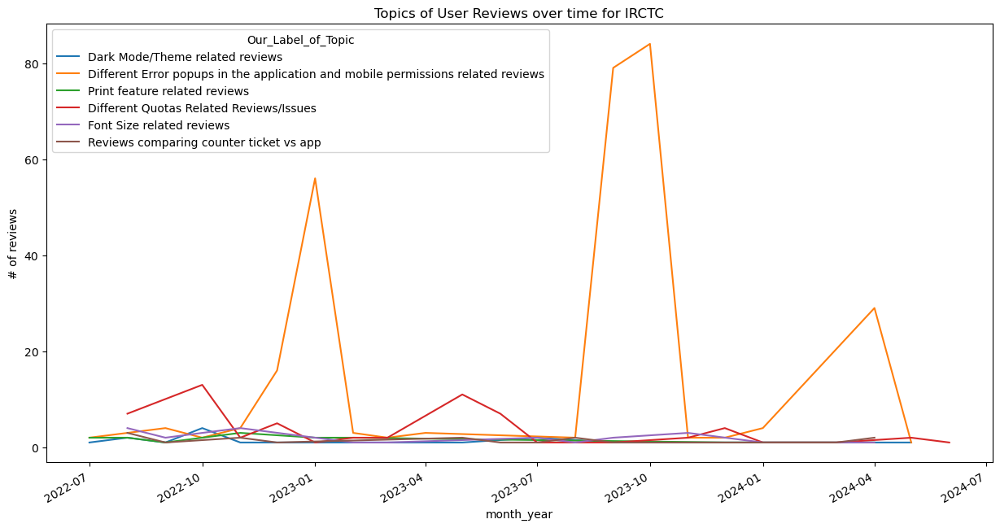

In [136]:
# make timeseries plot of reviews growth overtime
ind=[x for x in range(0,67,10)]
for i,x in enumerate(ind):
    if i==6:
        topics_bb=topics_b[x:]
    else:
        topics_bb=topics_b[x:ind[i+1]]
    time_ana=test_df[test_df.Our_Label_of_Topic.isin(topics_bb)][['at','Our_Label_of_Topic','actual_score']]
    time_ana['at']=pd.to_datetime(time_ana['at'])
    time_ana['month_year']=pd.to_datetime(time_ana['at'].dt.year.astype(str)+'-'+time_ana['at'].dt.month.astype(str))
    time_ana2=time_ana.groupby(['month_year','Our_Label_of_Topic'])['actual_score'].count().reset_index()
    plt.figure(figsize=(15,7))
    ax=sns.lineplot(data=time_ana2,x='month_year',y='actual_score',hue='Our_Label_of_Topic')
    #time_ana.groupby('month_year')['content'].count().rename('Total Reviews').plot(legend=True,ax=ax)
    ax.set_ylabel('# of reviews')
    ax.set_title('Topics of User Reviews over time for IRCTC')
    plt.xticks(rotation=30, ha='right')
    plt.show()
    #break

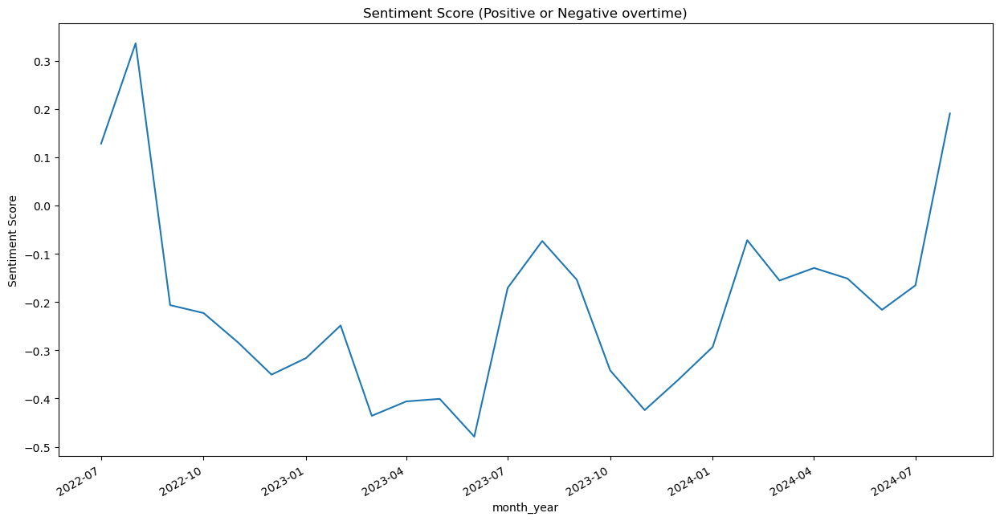

In [129]:
time_ana=test_df[['at','actual_score']]
time_ana['at']=pd.to_datetime(time_ana['at'])
time_ana['month_year']=pd.to_datetime(time_ana['at'].dt.year.astype(str)+'-'+time_ana['at'].dt.month.astype(str))
time_ana2=time_ana.groupby(['month_year'])['actual_score'].mean().reset_index()
plt.figure(figsize=(15,7))
ax=sns.lineplot(data=time_ana2,x='month_year',y='actual_score')
#time_ana.groupby('month_year')['content'].count().rename('Total Reviews').plot(legend=True,ax=ax)
ax.set_ylabel('Sentiment Score')
ax.set_title('Sentiment Score (Positive or Negative overtime)')
plt.xticks(rotation=30, ha='right')
plt.show()

In [213]:
a=pd.read_csv('harsh_class.csv')

In [257]:
aa=a.groupby(['Level 1 Grouping','Level 2 Grouping'])['Level 3 Grouping'].unique().reset_index()

In [ ]:
# overall grouping heirarchy

In [278]:
aa

,Level 1 Grouping,Level 2 Grouping,Level 3 Grouping
0,Ambiguous or Vague,Ambiguous or Vague,[Vague]
1,General Reviews,Booking and Travel Features,[Information/Ticket Details related Reviews]
2,General Reviews,Features and Usefulness,"[Various/New Features related reviews, Master List (feature) related reviews, Different functions-related reviews]"
3,General Reviews,General Review,[General Reviews]
4,General Reviews,Platform Experience,"[General Review about online platform, Platform/System related general reviews, Review related to duration/years of the application, General Reviews referring to app support]"
5,General Reviews,Service Experience,"[Service Related Review, Reviews addressing India or States of India, Indian Railways Dept. and their services, Reviews addressing rating of the app and its services, Railway coaches-related reviews, General user experience of different facilities reviews, Reviews comparing counter ticket vs app]"
6,General Reviews,Travel Experience,"[Journey and Travel related reviews, General experience/comfort related reviews]"
7,General Reviews,UI/UX Experience,"[Interface Related Reviews, Font Size related reviews, Dark Mode/Theme-related reviews]"
8,General Reviews,User Experience,[User experience related review]
9,General Reviews,User Satisfaction,"[User satisfaction-related reviews, User dissatisfaction/satisfaction related reviews]"


In [ ]:
# count of reviews across different topics

In [266]:
test_df.groupby('Our_Label_of_Topic')['content'].count().sort_values(ascending=False).reset_index()

,Our_Label_of_Topic,content
0,"Payment, Money and Slow-loading Related Issues",24236
1,Positive Reviews,23348
2,Negative Reviews,9822
3,"Payment, Money and Refund Related",4407
4,Vague,4362
...,...,...
61,Different functions related reviews,21
62,Reviews comparing counter ticket vs app,20
63,AC related reviews,17
64,Print feature related reviews,16


In [365]:
test_df.shape

(100000, 12)

In [372]:
c=pd.merge(test_df,a,right_on='Level 3 Grouping',left_on='Our_Label_of_Topic',how='left')

In [380]:
c.groupby(['Level 1 Grouping'])['reviewId'].nunique()

Level 1 Grouping
Ambiguous or Vague     4363
General Reviews        8331
Issues                49030
Negative Feedback     10944
Positive Feedback     27332
Name: reviewId, dtype: int64

In [381]:
c.groupby(['Level 1 Grouping','Level 2 Grouping'])['reviewId'].nunique()

Level 1 Grouping    Level 2 Grouping              
Ambiguous or Vague  Ambiguous or Vague                 4363
General Reviews     Booking and Travel Features          46
                    Features and Usefulness             337
                    General Review                     1592
                    Platform Experience                1053
                    Service Experience                 2800
                    Travel Experience                   290
                    UI/UX Experience                    252
                    User Experience                    1770
                    User Satisfaction                   191
Issues              Account and Authentication         3360
                    Advertisements                     1424
                    App Loading and Access             4623
                    Booking and Travel Features        3564
                    Customer Service                    411
                    Payment and Performance Issue